### Import Library

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random
from faker import Faker


### Create User Data Synthetic

In [6]:
SEED = 42
random.seed(SEED)
np.random.seed(SEED)

fake = Faker()
n_samples = 10000

genders = ["male", "female"]

activity_levels = {
    "Sedentary": 1.20,
    "Lightly Active": 1.375,
    "Moderately Active": 1.55,
    "Very Active": 1.725,
    "Extra Active": 1.90
}

dietary_patterns = [
    "Balanced",
    "Low Cholesterol",
    "High Protein",
    "Low Carb",
    "High Fiber",
    "Vegan",
    "Lactose Free",
    "Gluten Free",
    "Mediterranean"
]

allergies = [
    "Peanut",
    "Gluten",
    "Milk",
    "Egg",
    "Seafood",
    "Soy"
]

medical_conditions = [
    "Hypertension",
    "Diabetes",
    "High Cholesterol",
    "Asthma"
]

primary_goals = [
    "Weight Loss",
    "Muscle Gain",
    "Maintenance",
    "Healthy Lifestyle"
]

preferred_activities = [
    "Yoga",
    "Running",
    "Weight Training",
    "Walking",
    "Cycling"
]

def calculate_bmr(gender, weight, height, age):
    if gender == "male":
        return (
            10 * weight
            + 6.25 * height
            - 5 * age
            + 5
        )
    return (
        10 * weight
        + 6.25 * height
        - 5 * age
        - 161
    )

def determine_activity_level(bmi, age):
    if bmi >= 32:
        weights = [45, 30, 15, 8, 2]
    elif bmi >= 25:
        weights = [30, 35, 22, 10, 3]
    elif bmi < 18.5:
        weights = [18, 28, 35, 14, 5]
    else:
        weights = [15, 28, 37, 15, 5]
    if age > 50:
        weights[0] += 8
        weights[1] += 4
        weights[3] -= 5
        weights[4] -= 3
    return random.choices(
        list(activity_levels.keys()),
        weights=weights,
        k=1
    )[0]

def determine_medical_history(
    bmi,
    age,
    activity_level
):
    conditions = []
    hypertension_prob = (
        0.03
        + max(0, bmi - 25) * 0.015
        + max(0, age - 40) * 0.008
    )
    if activity_level == "Sedentary":
        hypertension_prob += 0.08
    if random.random() < min(0.75, hypertension_prob):
        conditions.append("Hypertension")
    diabetes_prob = (
        0.02
        + max(0, bmi - 27) * 0.018
        + max(0, age - 45) * 0.006
    )
    if random.random() < min(0.60, diabetes_prob):
        conditions.append("Diabetes")
    cholesterol_prob = (
        0.05
        + max(0, bmi - 24) * 0.012
    )
    if random.random() < min(0.65, cholesterol_prob):
        conditions.append("High Cholesterol")
    if random.random() < 0.08:
        conditions.append("Asthma")
    if len(conditions) == 0:
        return "No Medical History"
    return ", ".join(sorted(set(conditions)))

def determine_goal(bmi):

    if bmi >= 30:
        weights = [55, 8, 10, 27]
    elif bmi >= 25:
        weights = [42, 15, 18, 25]
    elif bmi < 18.5:
        weights = [5, 45, 20, 30]
    else:
        weights = [18, 22, 30, 30]
    return random.choices(
        primary_goals,
        weights=weights,
        k=1
    )[0]

rows = []
for _ in range(n_samples):
    gender = random.choice(genders)
    age = int(np.clip(
        np.random.normal(35, 11),
        18,
        70
    ))

    if gender == "male":
        height = np.random.normal(172, 7)
    else:
        height = np.random.normal(160, 6)

    height = round(np.clip(height, 145, 200), 1)

    bmi = np.clip(
        np.random.normal(26, 5.8),
        16,
        40
    )
    bmi += (age - 35) * 0.03
    bmi = round(bmi, 1)

    height_m = height / 100
    weight = (
        bmi * (height_m ** 2)
        + np.random.normal(0, 2.5)
    )
    weight = round(
        np.clip(weight, 38, 150),
        1
    )

    smoking_habits = random.choices(
        ["Yes", "No"],
        weights=[17, 83],
        k=1
    )[0]

    activity_level = determine_activity_level(
        bmi,
        age
    )
    activity_multiplier = activity_levels[
        activity_level
    ]

    primary_goal = determine_goal(bmi)

    medical_history = determine_medical_history(
        bmi,
        age,
        activity_level
    )

    allergy = (
        random.choice(allergies)
        if random.random() < 0.28
        else np.nan
    )

    systolic = (
        105
        + age * 0.35
        + (bmi - 22) * 0.9
        + np.random.normal(0, 8)
    )

    diastolic = (
        65
        + age * 0.20
        + (bmi - 22) * 0.5
        + np.random.normal(0, 6)
    )

    if smoking_habits == "Yes":
        systolic += 4
        diastolic += 2

    if "Hypertension" in medical_history:
        systolic += np.random.uniform(10, 25)
        diastolic += np.random.uniform(8, 15)

    systolic = int(np.clip(systolic, 85, 220))
    diastolic = int(np.clip(diastolic, 50, 130))

    resting_hr = (
        72
        + (bmi - 25) * 0.4
        - age * 0.05
        + np.random.normal(0, 6)
    )

    if activity_level in [
        "Very Active",
        "Extra Active"
    ]:
        resting_hr -= 8

    if smoking_habits == "Yes":
        resting_hr += 5

    resting_hr = int(np.clip(
        resting_hr,
        45,
        110
    ))

    sleep_hours = (
        np.random.normal(7.2, 1)
    )

    if bmi >= 30:
        sleep_hours -= 0.5

    if activity_level in [
        "Very Active",
        "Extra Active"
    ]:
        sleep_hours += 0.4

    sleep_hours = round(
        np.clip(
            sleep_hours, 4, 10
        ),
        1
    )

    water_intake_goal = int(
        np.clip(
            weight * np.random.uniform(30, 38),
            1500,
            4500
        )
    )

    commitment_days = random.randint(
        2,
        7
    )

    if primary_goal == "Weight Loss":

        target_weight = (
            weight
            * np.random.uniform(
                0.82,
                0.95
            )
        )
    elif primary_goal == "Muscle Gain":

        target_weight = (
            weight
            * np.random.uniform(
                1.03,
                1.12
            )
        )
    else:
        target_weight = (
            weight
            * np.random.uniform(
                0.97,
                1.03
            )
        )
    target_weight = round(
        np.clip(
            target_weight,
            40,
            160
        ),
        1
    )
    bmr = round(
        calculate_bmr(
            gender,
            weight,
            height,
            age
        ),
        2
    )
    tdee = round(
        bmr *
        activity_multiplier *
        np.random.uniform(
            0.96,
            1.04
        ),
        2
    )
    if primary_goal == "Weight Loss":

        calorie_target = (
            tdee
            * np.random.uniform(
                0.72,
                0.88
            )
        )
    elif primary_goal == "Muscle Gain":
        calorie_target = (
            tdee
            * np.random.uniform(
                1.08,
                1.18
            )
        )
    else:
        calorie_target = (
            tdee
            * np.random.uniform(
                0.95,
                1.05
            )
        )

    calorie_target = round(
        max(
            1200,
            calorie_target
        ),
        2
    )

    if random.random() < 0.03:
        sleep_hours = np.nan
    if random.random() < 0.018:
        water_intake_goal = np.nan
    if random.random() < 0.56:
        medical_history = np.nan

    rows.append({
        "age": age,
        "gender": gender,
        "weight": weight,
        "height": height,
        "BMI": bmi,
        "activity_level": activity_level,
        "allergy": allergy,
        "medical_history": medical_history,
        "blood_pressure_systolic": systolic,
        "blood_pressure_diastolic": diastolic,
        "heart_rate": resting_hr,
        "daily_water_intake_goal": water_intake_goal,
        "avg_sleep_hours": sleep_hours,
        "smoking_habits": smoking_habits,
        "primary_goal": primary_goal,
        "commitment_days": commitment_days,
        "target_weight_kg": target_weight,
        "BMR": bmr,
        "TDEE": tdee,
        "calorie_target_derived": calorie_target
    })
df_user = pd.DataFrame(rows)
output_path = "synthetic_healthplan_users_v2.csv"
df_user.to_csv(
    output_path,
    index=False
)
print(df_user.head())
print(df_user.shape)

   age  gender  weight  height   BMI     activity_level allergy  \
0   40    male    91.2   171.0  29.9          Sedentary     NaN   
1   29    male    72.6   168.7  27.2  Moderately Active     Egg   
2   35    male    60.1   162.0  22.8          Sedentary     NaN   
3   44  female    59.2   152.7  27.5  Moderately Active    Milk   
4   18    male    66.2   167.0  22.8  Moderately Active     NaN   

      medical_history  blood_pressure_systolic  blood_pressure_diastolic  \
0  No Medical History                      128                        77   
1  No Medical History                      106                        70   
2  No Medical History                      112                        76   
3                 NaN                      114                        77   
4                 NaN                      114                        58   

   heart_rate  daily_water_intake_goal  avg_sleep_hours smoking_habits  \
0          86                   2751.0              8.0           

### Load Dataset

In [10]:
user_path = "synthetic_healthplan_users_v2.csv"

In [11]:
recipe_path = "cleaned_recipe_dataset.csv"

In [ ]:
df_user.head()

,age,gender,weight,height,BMI,activity_level,allergy,medical_history,blood_pressure_systolic,blood_pressure_diastolic,heart_rate,daily_water_intake_goal,avg_sleep_hours,smoking_habits,primary_goal,commitment_days,target_weight_kg,BMR,TDEE,calorie_target_derived
0,40,male,91.2,171.0,29.9,Sedentary,NaN,No Medical History,128,77,86,2751.0,8.0,Yes,Weight Loss,2,86.3,1785.75,2199.89,1658.66
1,29,male,72.6,168.7,27.2,Moderately Active,Egg,No Medical History,106,70,65,2347.0,7.5,No,Weight Loss,4,63.0,1640.38,2533.65,2142.53
2,35,male,60.1,162.0,22.8,Sedentary,NaN,No Medical History,112,76,70,2131.0,6.9,Yes,Healthy Lifestyle,5,59.9,1443.50,1679.82,1679.01
3,44,female,59.2,152.7,27.5,Moderately Active,Milk,NaN,114,77,75,1817.0,7.4,No,Weight Loss,5,50.1,1165.38,1740.62,1343.85
4,18,male,66.2,167.0,22.8,Moderately Active,NaN,NaN,114,58,72,2025.0,6.8,No,Maintenance,4,68.1,1620.75,2566.88,2489.54


In [12]:
df_user.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   age                       10000 non-null  int64  
 1   gender                    10000 non-null  object 
 2   weight                    10000 non-null  float64
 3   height                    10000 non-null  float64
 4   BMI                       10000 non-null  float64
 5   activity_level            10000 non-null  object 
 6   allergy                   2820 non-null   object 
 7   medical_history           4487 non-null   object 
 8   blood_pressure_systolic   10000 non-null  int64  
 9   blood_pressure_diastolic  10000 non-null  int64  
 10  heart_rate                10000 non-null  int64  
 11  daily_water_intake_goal   9832 non-null   float64
 12  avg_sleep_hours           9694 non-null   float64
 13  smoking_habits            10000 non-null  object 
 14  primary

In [13]:
df_user.drop(columns=["smoking_habits"], inplace=True)

### Visualization

DATASET INFO
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 19 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   age                       10000 non-null  int64  
 1   gender                    10000 non-null  object 
 2   weight                    10000 non-null  float64
 3   height                    10000 non-null  float64
 4   BMI                       10000 non-null  float64
 5   activity_level            10000 non-null  object 
 6   allergy                   2820 non-null   object 
 7   medical_history           4487 non-null   object 
 8   blood_pressure_systolic   10000 non-null  int64  
 9   blood_pressure_diastolic  10000 non-null  int64  
 10  heart_rate                10000 non-null  int64  
 11  daily_water_intake_goal   9832 non-null   float64
 12  avg_sleep_hours           9694 non-null   float64
 13  primary_goal              10000 non-null  object 

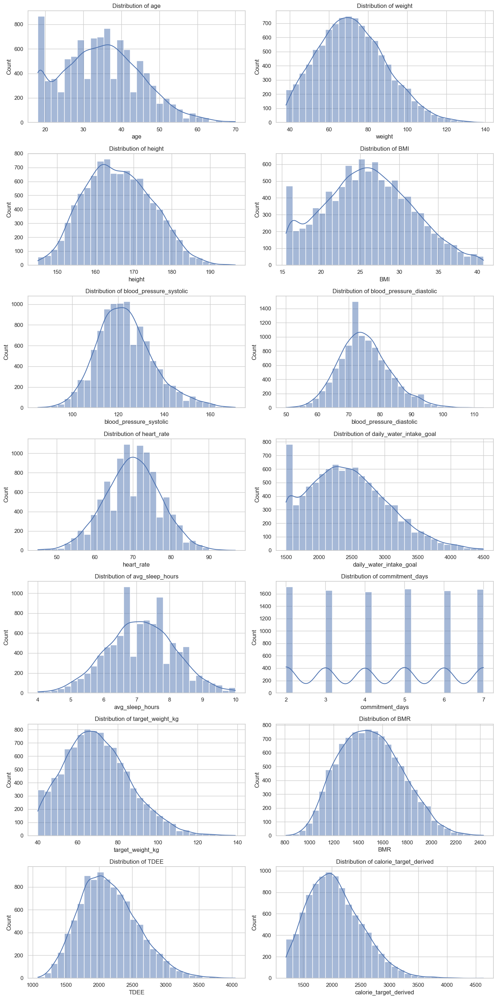

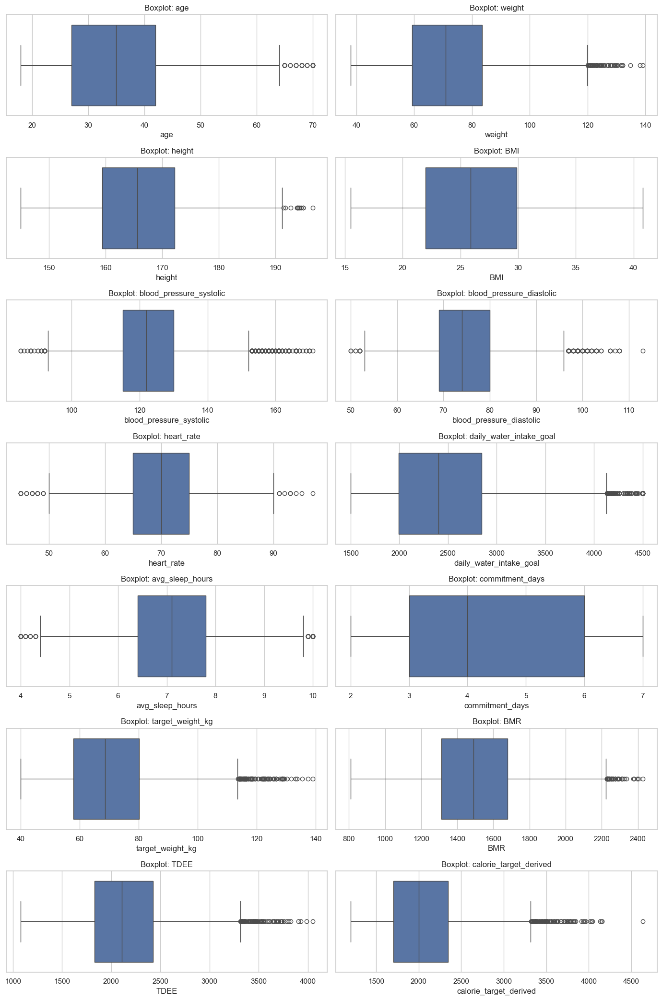

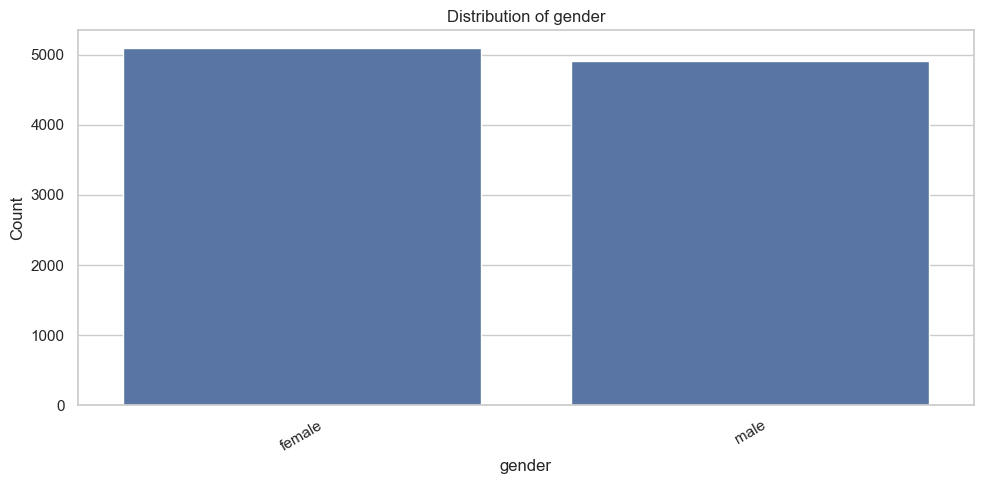

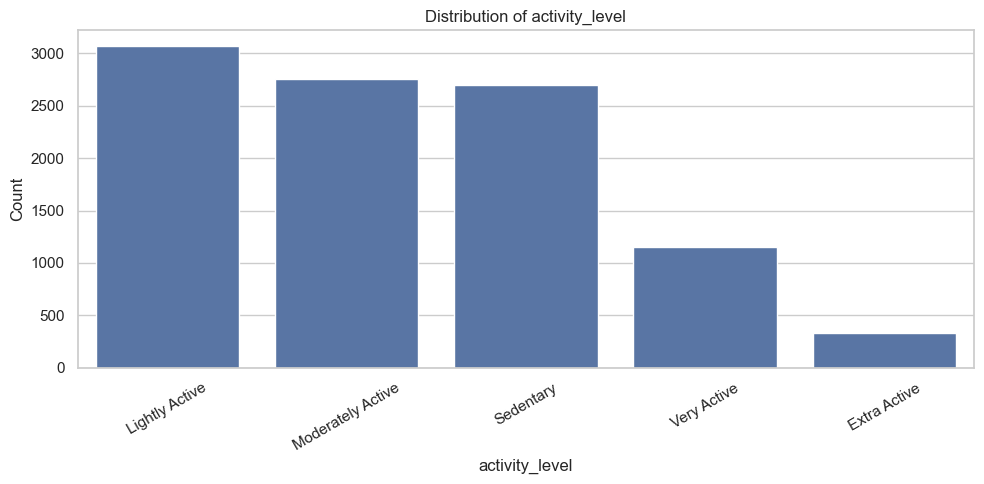

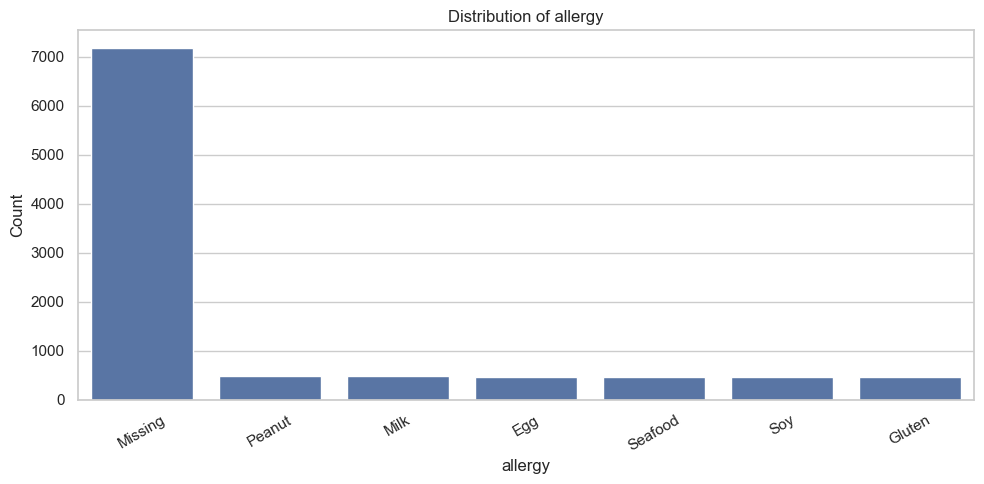

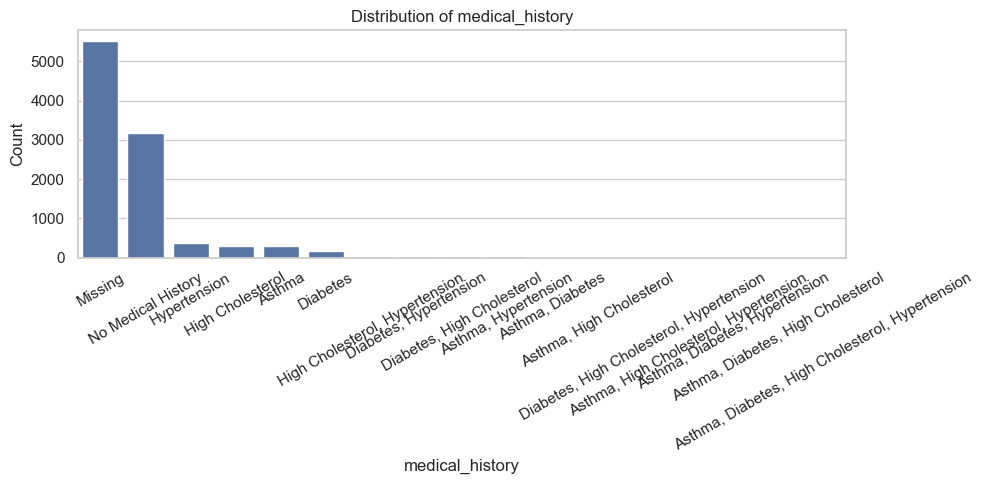

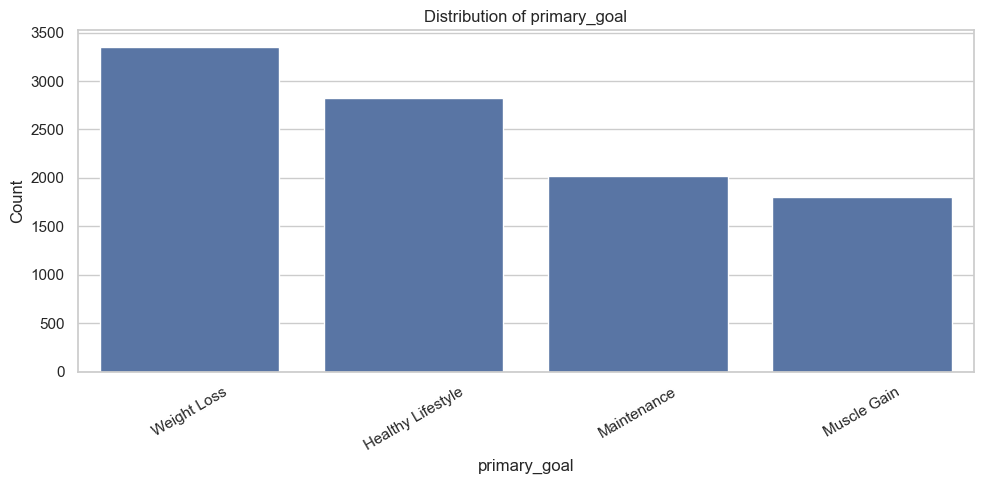

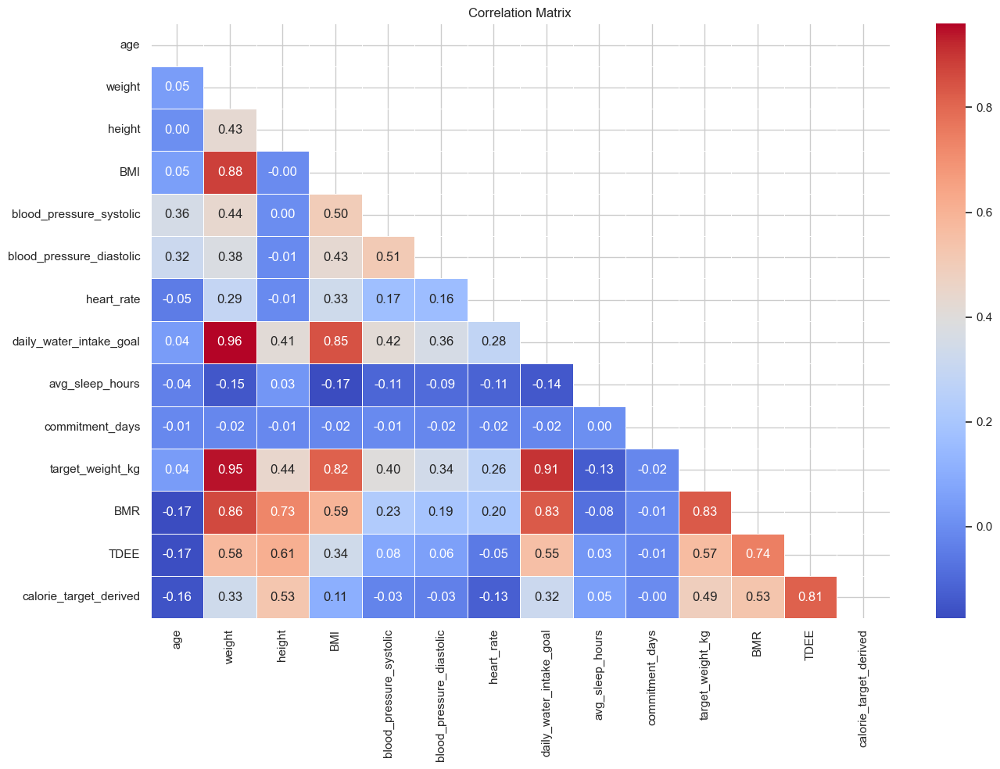

POTENTIAL FEATURE LEAKAGE
                   Feature_1                Feature_2  Correlation
21                    weight  daily_water_intake_goal     0.959795
99   daily_water_intake_goal                   weight     0.959795
141         target_weight_kg                   weight     0.945274
24                    weight         target_weight_kg     0.945274
108  daily_water_intake_goal         target_weight_kg     0.906307
147         target_weight_kg  daily_water_intake_goal     0.906307
43                       BMI                   weight     0.883633
17                    weight                      BMI     0.883633
25                    weight                      BMR     0.863139
155                      BMR                   weight     0.863139
101  daily_water_intake_goal                      BMI     0.846254
49                       BMI  daily_water_intake_goal     0.846254
151         target_weight_kg                      BMR     0.831020
164                      BMR        

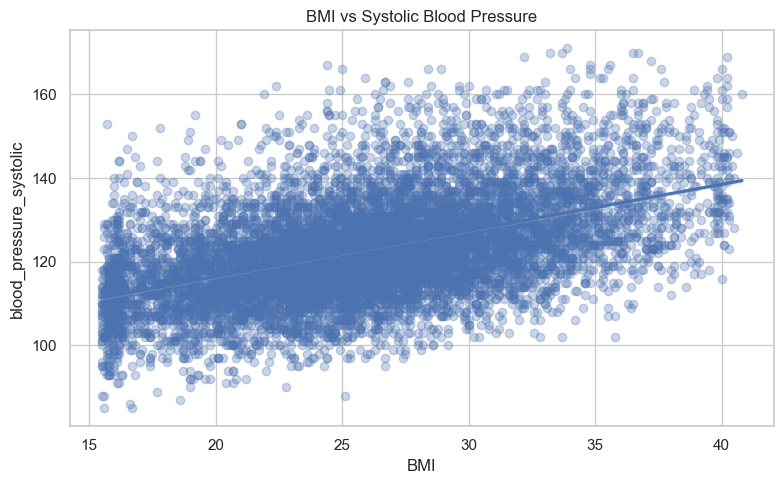

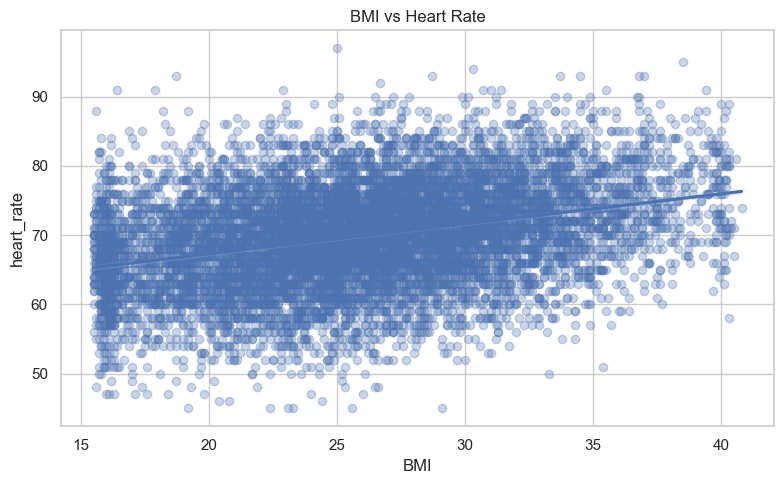

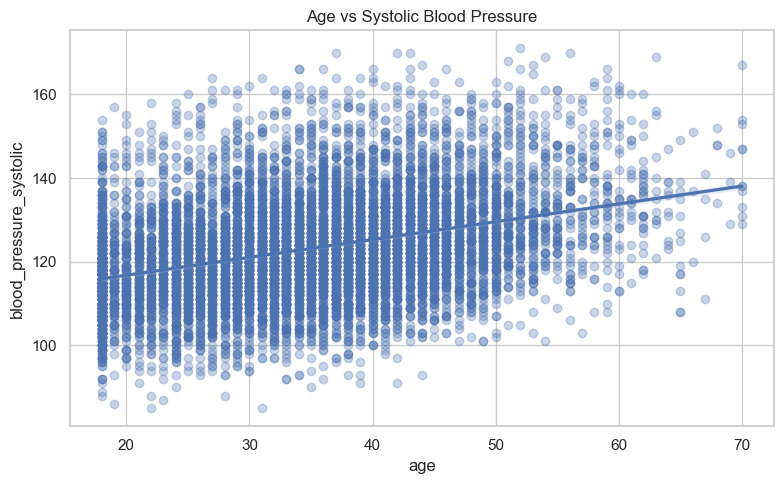

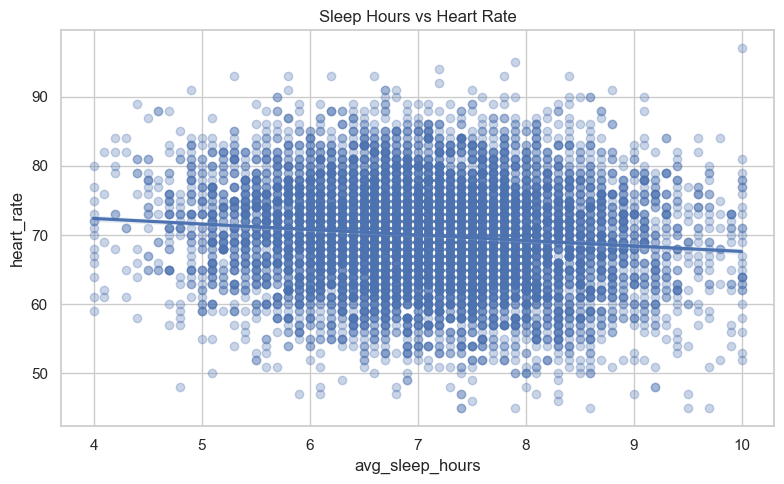

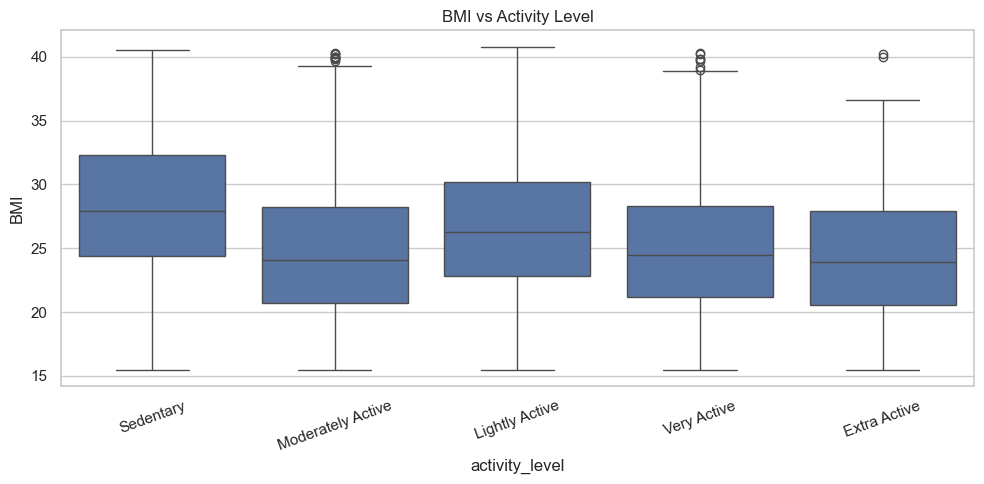

...

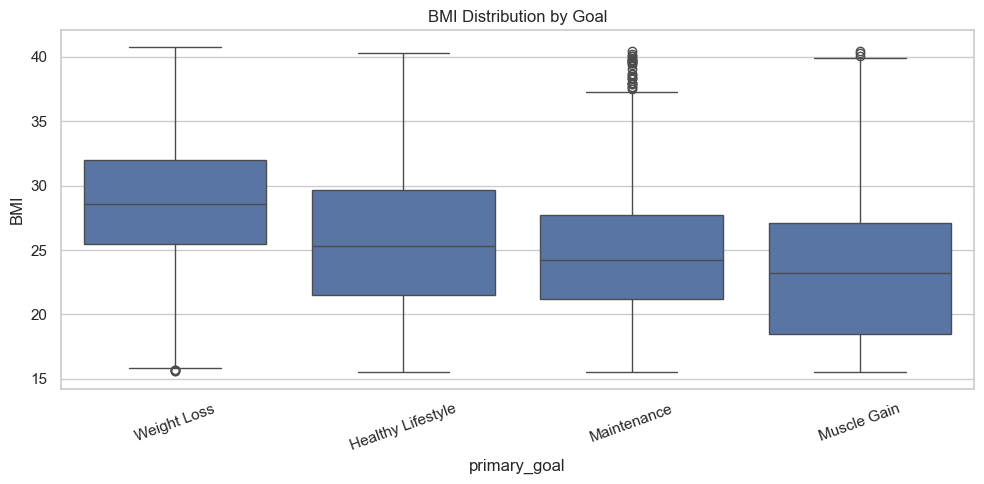

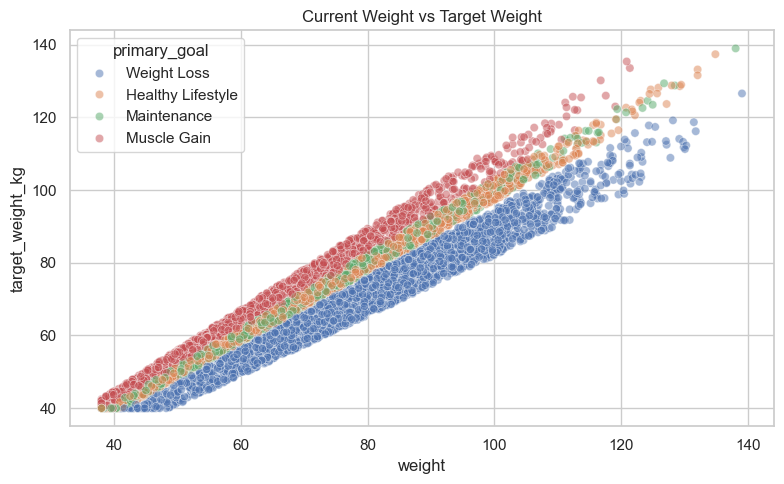

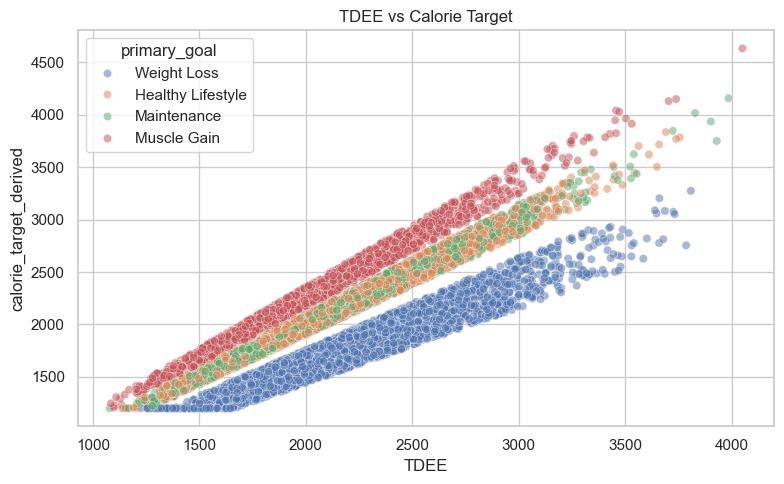

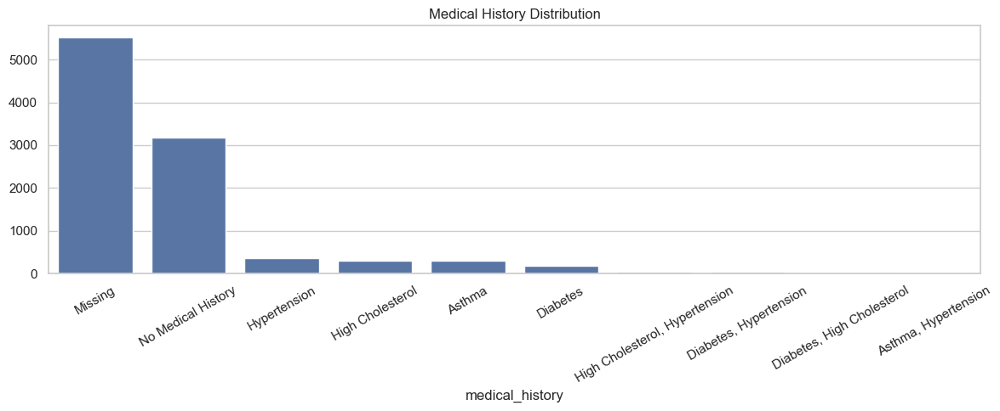

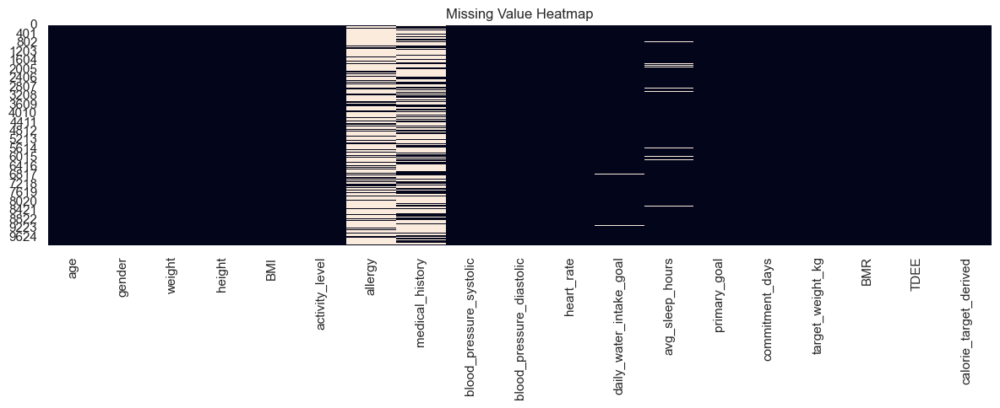

NUMERICAL SUMMARY
                            count         mean         std      min  \
age                       10000.0    34.858200   10.366949    18.00   
weight                    10000.0    71.947210   17.520011    38.00   
height                    10000.0   165.965520    8.770507   145.00   
BMI                       10000.0    26.049100    5.620350    15.50   
blood_pressure_systolic   10000.0   123.131500   12.420863    85.00   
blood_pressure_diastolic  10000.0    75.016100    8.173489    50.00   
heart_rate                10000.0    69.930700    7.301221    45.00   
daily_water_intake_goal    9832.0  2451.830553  609.758759  1500.00   
avg_sleep_hours            9694.0     7.120281    1.040287     4.00   
commitment_days           10000.0     4.491000    1.715521     2.00   
target_weight_kg          10000.0    69.791250   16.347502    40.00   
BMR                       10000.0  1502.921804  255.814479   809.62   
TDEE                      10000.0  2148.379899  437.006128 

In [14]:
plt.style.use("default")
sns.set_theme(style="whitegrid")

# =========================================================
# NUMERICAL & CATEGORICAL COLUMNS
# =========================================================

numerical_cols = [
    "age",
    "weight",
    "height",
    "BMI",
    "blood_pressure_systolic",
    "blood_pressure_diastolic",
    "heart_rate",
    "daily_water_intake_goal",
    "avg_sleep_hours",
    "commitment_days",
    "target_weight_kg",
    "BMR",
    "TDEE",
    "calorie_target_derived"
]

categorical_cols = [
    "gender",
    "activity_level",
    "allergy",
    "medical_history",
    "primary_goal"
]

# =========================================================
# BASIC INFO
# =========================================================

print("=" * 60)
print("DATASET INFO")
print("=" * 60)

print(df_user.info())

print("\nDataset Shape:")
print(df_user.shape)

print("\nMissing Values:")
print(df_user.isnull().sum())

print("\nMissing Percentage:")
print(
    (
        df_user.isnull().mean() * 100
    ).sort_values(ascending=False)
)

# =========================================================
# NUMERICAL DISTRIBUTIONS
# (2 plots per row for readability)
# =========================================================

n_cols = 2
n_rows = int(np.ceil(len(numerical_cols) / n_cols))

fig, axes = plt.subplots(
    n_rows,
    n_cols,
    figsize=(14, 4 * n_rows)
)

axes = axes.flatten()

for i, col in enumerate(numerical_cols):

    sns.histplot(
        df_user[col],
        kde=True,
        bins=30,
        ax=axes[i]
    )

    axes[i].set_title(
        f"Distribution of {col}"
    )

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# =========================================================
# BOXPLOTS (OUTLIER CHECK)
# =========================================================

fig, axes = plt.subplots(
    n_rows,
    n_cols,
    figsize=(14, 3 * n_rows)
)

axes = axes.flatten()

for i, col in enumerate(numerical_cols):

    sns.boxplot(
        x=df_user[col],
        ax=axes[i]
    )

    axes[i].set_title(
        f"Boxplot: {col}"
    )

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# =========================================================
# CATEGORICAL DISTRIBUTION
# =========================================================

for col in categorical_cols:

    plt.figure(figsize=(10, 5))

    value_counts = (
        df_user[col]
        .fillna("Missing")
        .value_counts()
    )

    sns.barplot(
        x=value_counts.index,
        y=value_counts.values
    )

    plt.title(
        f"Distribution of {col}"
    )

    plt.xlabel(col)
    plt.ylabel("Count")

    plt.xticks(rotation=30)

    plt.tight_layout()
    plt.show()

# =========================================================
# CORRELATION MATRIX
# =========================================================

corr_matrix = (
    df_user[numerical_cols]
    .corr()
)

plt.figure(figsize=(14, 10))

mask = np.triu(
    np.ones_like(corr_matrix)
)

sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    linewidths=0.5,
    mask=mask
)

plt.title(
    "Correlation Matrix"
)

plt.tight_layout()
plt.show()

# =========================================================
# HIGH CORRELATION CHECK
# (Detect potential leakage)
# =========================================================

corr_pairs = (
    corr_matrix
    .unstack()
    .reset_index()
)

corr_pairs.columns = [
    "Feature_1",
    "Feature_2",
    "Correlation"
]

corr_pairs = corr_pairs[
    corr_pairs["Feature_1"]
    != corr_pairs["Feature_2"]
]

corr_pairs["abs_corr"] = (
    corr_pairs["Correlation"]
    .abs()
)

high_corr = (
    corr_pairs[
        corr_pairs["abs_corr"] >= 0.75
    ]
    .sort_values(
        "abs_corr",
        ascending=False
    )
)

print("=" * 60)
print("POTENTIAL FEATURE LEAKAGE")
print("=" * 60)

print(
    high_corr[
        [
            "Feature_1",
            "Feature_2",
            "Correlation"
        ]
    ]
    .drop_duplicates()
)

# =========================================================
# RELATIONSHIP VISUALIZATION
# =========================================================

# BMI vs Blood Pressure
plt.figure(figsize=(8, 5))

sns.regplot(
    x="BMI",
    y="blood_pressure_systolic",
    data=df_user,
    scatter_kws={"alpha": 0.3}
)

plt.title(
    "BMI vs Systolic Blood Pressure"
)

plt.tight_layout()
plt.show()

# =========================================================
# BMI vs Heart Rate
# =========================================================

plt.figure(figsize=(8, 5))

sns.regplot(
    x="BMI",
    y="heart_rate",
    data=df_user,
    scatter_kws={"alpha": 0.3}
)

plt.title(
    "BMI vs Heart Rate"
)

plt.tight_layout()
plt.show()

# =========================================================
# AGE vs BLOOD PRESSURE
# =========================================================

plt.figure(figsize=(8, 5))

sns.regplot(
    x="age",
    y="blood_pressure_systolic",
    data=df_user,
    scatter_kws={"alpha": 0.3}
)

plt.title(
    "Age vs Systolic Blood Pressure"
)

plt.tight_layout()
plt.show()

# =========================================================
# SLEEP HOURS vs HEART RATE
# =========================================================

plt.figure(figsize=(8, 5))

sns.regplot(
    x="avg_sleep_hours",
    y="heart_rate",
    data=df_user,
    scatter_kws={"alpha": 0.3}
)

plt.title(
    "Sleep Hours vs Heart Rate"
)

plt.tight_layout()
plt.show()

# =========================================================
# BMI vs Activity Level
# =========================================================

plt.figure(figsize=(10, 5))

sns.boxplot(
    x="activity_level",
    y="BMI",
    data=df_user
)

plt.title(
    "BMI vs Activity Level"
)

plt.xticks(rotation=20)

plt.tight_layout()
plt.show()

# =========================================================
# TDEE vs Activity Level
# =========================================================

plt.figure(figsize=(10, 5))

sns.boxplot(
    x="activity_level",
    y="TDEE",
    data=df_user
)

plt.title(
    "TDEE vs Activity Level"
)

plt.xticks(rotation=20)

plt.tight_layout()
plt.show()

# =========================================================
# PRIMARY GOAL vs BMI
# =========================================================

plt.figure(figsize=(10, 5))

sns.boxplot(
    x="primary_goal",
    y="BMI",
    data=df_user
)

plt.title(
    "BMI Distribution by Goal"
)

plt.xticks(rotation=20)

plt.tight_layout()
plt.show()

# =========================================================
# TARGET WEIGHT vs CURRENT WEIGHT
# (Check overfitting risk)
# =========================================================

plt.figure(figsize=(8, 5))

sns.scatterplot(
    x="weight",
    y="target_weight_kg",
    hue="primary_goal",
    alpha=0.5,
    data=df_user
)

plt.title(
    "Current Weight vs Target Weight"
)

plt.tight_layout()
plt.show()

# =========================================================
# TDEE vs CALORIE TARGET
# (Leakage detection)
# =========================================================

plt.figure(figsize=(8, 5))

sns.scatterplot(
    x="TDEE",
    y="calorie_target_derived",
    hue="primary_goal",
    alpha=0.5,
    data=df_user
)

plt.title(
    "TDEE vs Calorie Target"
)

plt.tight_layout()
plt.show()

# =========================================================
# MEDICAL HISTORY DISTRIBUTION
# =========================================================

medical_counts = (
    df_user["medical_history"]
    .fillna("Missing")
    .value_counts()
    .head(10)
)

plt.figure(figsize=(12, 5))

sns.barplot(
    x=medical_counts.index,
    y=medical_counts.values
)

plt.title(
    "Medical History Distribution"
)

plt.xticks(rotation=30)

plt.tight_layout()
plt.show()

# =========================================================
# MISSING VALUE HEATMAP
# =========================================================

plt.figure(figsize=(12, 5))

sns.heatmap(
    df_user.isnull(),
    cbar=False
)

plt.title(
    "Missing Value Heatmap"
)

plt.tight_layout()
plt.show()

# =========================================================
# SUMMARY STATISTICS
# =========================================================

print("=" * 60)
print("NUMERICAL SUMMARY")
print("=" * 60)

print(
    df_user[
        numerical_cols
    ].describe().T
)

print("=" * 60)
print("CATEGORICAL SUMMARY")
print("=" * 60)

for col in categorical_cols:

    print(f"\n{col}")

    print(
        df_user[col]
        .fillna("Missing")
        .value_counts(
            normalize=True
        )
        .round(3)
    )

In [ ]:
df_user["allergy"] = (
    df_user["allergy"]
    .fillna("No Allergy")
)

print(
    df_user["allergy"]
    .value_counts(dropna=False)
)

allergy
No Allergy    7180
Peanut         487
Milk           475
Egg            473
Seafood        469
Soy            463
Gluten         453
Name: count, dtype: int64


### Handling Missing Value

In [15]:
# ======================================================
# ALLERGY
# ======================================================

df_user["allergy"] = (
    df_user["allergy"]
    .fillna("No Allergy")
)

# ======================================================
# MEDICAL HISTORY
# ======================================================

df_user["medical_history"] = (
    df_user["medical_history"]
    .fillna("Unknown")
)

# ======================================================
# SLEEP HOURS
# ======================================================

df_user["avg_sleep_hours"] = (
    df_user["avg_sleep_hours"]
    .fillna(
        df_user[
            "avg_sleep_hours"
        ].median()
    )
)

# ======================================================
# WATER INTAKE
# ======================================================

df_user[
    "daily_water_intake_goal"
] = np.where(
    df_user[
        "daily_water_intake_goal"
    ].isna(),

    (
        df_user["weight"] * 35
    ).astype(int),

    df_user[
        "daily_water_intake_goal"
    ]
)

In [ ]:
df_user.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 19 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   age                       10000 non-null  int64  
 1   gender                    10000 non-null  object 
 2   weight                    10000 non-null  float64
 3   height                    10000 non-null  float64
 4   BMI                       10000 non-null  float64
 5   activity_level            10000 non-null  object 
 6   allergy                   10000 non-null  object 
 7   medical_history           10000 non-null  object 
 8   blood_pressure_systolic   10000 non-null  int64  
 9   blood_pressure_diastolic  10000 non-null  int64  
 10  heart_rate                10000 non-null  int64  
 11  daily_water_intake_goal   10000 non-null  float64
 12  avg_sleep_hours           10000 non-null  float64
 13  primary_goal              10000 non-null  object 
 14  commitm

### Feature Engineering

In [16]:
df_fe = df_user.copy()
df_fe["age_group"] = pd.cut(
    df_fe["age"],
    bins=[17, 29, 44, 59, 100],
    labels=[
        "Young Adult",
        "Adult",
        "Middle Age",
        "Senior"
    ]
)

df_fe["bmi_category"] = pd.cut(
    df_fe["BMI"],
    bins=[0, 18.5, 25, 30, 100],
    labels=[
        "Underweight",
        "Normal",
        "Overweight",
        "Obese"
    ]
)

def bp_category(sys, dia):

    if sys < 120 and dia < 80:
        return "Normal"

    elif sys < 130 and dia < 80:
        return "Elevated"

    elif sys < 140 or dia < 90:
        return "Hypertension Stage 1"

    return "Hypertension Stage 2"


df_fe["bp_category"] = df_fe.apply(
    lambda x: bp_category(
        x["blood_pressure_systolic"],
        x["blood_pressure_diastolic"]
    ),
    axis=1
)

def sleep_quality(hours):

    if pd.isna(hours):
        return "Unknown"
    if hours < 6:
        return "Poor"
    elif hours <= 8:
        return "Normal"
    return "Optimal"

df_fe["sleep_quality"] = (
    df_fe["avg_sleep_hours"]
    .apply(sleep_quality)
)

df_fe["water_ml_per_kg"] = (
    df_fe["daily_water_intake_goal"]
    / df_fe["weight"]
)

# Activity Score
activity_map = {
    "Sedentary": 1,
    "Lightly Active": 2,
    "Moderately Active": 3,
    "Very Active": 4,
    "Extra Active": 5
}

df_fe["activity_score"] = (
    df_fe["activity_level"]
    .map(activity_map)
)

# Calorie Gap
df_fe["calorie_gap"] = (
    df_fe["calorie_target_derived"]
    - df_fe["TDEE"]
)

# Target Weight Change
df_fe["target_weight_change"] = (
    df_fe["target_weight_kg"]
    - df_fe["weight"]
)

df_fe["target_weight_change_pct"] = (
    (
        df_fe["target_weight_kg"]
        - df_fe["weight"]
    )
    /
    df_fe["weight"]
) * 100

# Health Risk Score
risk_score = np.zeros(len(df_fe))
risk_score += np.where(
    df_fe["BMI"] >= 25,
    1,
    0
)

risk_score += np.where(
    df_fe["BMI"] >= 30,
    2,
    0
)

risk_score += np.where(
    df_fe["medical_history"]
    .fillna("")
    .str.contains(
        "Diabetes|Hypertension|High Cholesterol",
        regex=True
    ),
    3,
    0
)

df_fe["health_risk_score"] = risk_score

#Dietary Restriction
def dietary_restriction(row):

    medical = str(
        row["medical_history"]
    )

    if "Diabetes" in medical:
        return "Low Sugar"

    elif (
        "Hypertension" in medical
        or row[
            "blood_pressure_systolic"
        ] >= 140
    ):
        return "Low Sodium"

    elif row["BMI"] >= 27:
        return "Low Calorie"

    elif row[
        "primary_goal"
    ] == "Muscle Gain":
        return "High Protein"

    return "Balanced"


df_fe[
    "dietary_restriction"
] = df_fe.apply(
    dietary_restriction,
    axis=1
)

# Feature Check
print(df_fe.shape)

print("\nNew Features Added:")
print(
    sorted(
        set(df_fe.columns)
        -
        set(df_user.columns)
    )
)

print(df_fe.head())

(10000, 30)

New Features Added:
['activity_score', 'age_group', 'bmi_category', 'bp_category', 'calorie_gap', 'dietary_restriction', 'health_risk_score', 'sleep_quality', 'target_weight_change', 'target_weight_change_pct', 'water_ml_per_kg']
   age  gender  weight  height   BMI     activity_level     allergy  \
0   40    male    91.2   171.0  29.9          Sedentary  No Allergy   
1   29    male    72.6   168.7  27.2  Moderately Active         Egg   
2   35    male    60.1   162.0  22.8          Sedentary  No Allergy   
3   44  female    59.2   152.7  27.5  Moderately Active        Milk   
4   18    male    66.2   167.0  22.8  Moderately Active  No Allergy   

      medical_history  blood_pressure_systolic  blood_pressure_diastolic  ...  \
0  No Medical History                      128                        77  ...   
1  No Medical History                      106                        70  ...   
2  No Medical History                      112                        76  ...   
3     

### Encoding

In [18]:
import pandas as pd

df_encoded = df_fe.copy()

# Ordinal encoding
activity_map = {
    "Sedentary": 1,
    "Lightly Active": 2,
    "Moderately Active": 3,
    "Very Active": 4,
    "Extra Active": 5
}

sleep_map = {
    "Unknown": 0,
    "Poor": 1,
    "Normal": 2,
    "Optimal": 3
}

bmi_map = {
    "Underweight": 1,
    "Normal": 2,
    "Overweight": 3,
    "Obese": 4
}

bp_map = {
    "Normal": 1,
    "Elevated": 2,
    "Hypertension Stage 1": 3,
    "Hypertension Stage 2": 4
}

age_group_map = {
    "Young Adult": 1,
    "Adult": 2,
    "Middle Age": 3,
    "Senior": 4
}

df_encoded["activity_level_encoded"] = df_encoded["activity_level"].map(activity_map)
df_encoded["sleep_quality_encoded"] = df_encoded["sleep_quality"].map(sleep_map)
df_encoded["bmi_category_encoded"] = df_encoded["bmi_category"].map(bmi_map)
df_encoded["bp_category_encoded"] = df_encoded["bp_category"].map(bp_map)
df_encoded["age_group_encoded"] = df_encoded["age_group"].map(age_group_map)

# Binary encoding
df_encoded["gender_encoded"] = df_encoded["gender"].map({
    "male": 1,
    "female": 0
})

# Multi-hot medical history encoding
conditions = [
    "Diabetes",
    "Hypertension",
    "Asthma",
    "High Cholesterol"
]

for condition in conditions:
    col_name = (
        "has_" +
        condition.lower().replace(" ", "_")
    )

    df_encoded[col_name] = (
        df_encoded["medical_history"]
        .str.contains(condition, na=False)
        .astype(int)
    )

df_encoded["medical_unknown"] = (
    df_encoded["medical_history"]
    .eq("Unknown")
    .astype(int)
)

df_encoded["no_medical_history"] = (
    df_encoded["medical_history"]
    .eq("No Medical History")
    .astype(int)
)

# One-hot encoding
one_hot_cols = [
    "allergy",
    "primary_goal",
    "dietary_restriction"
]

df_encoded = pd.get_dummies(
    df_encoded,
    columns=one_hot_cols,
    drop_first=False
)

# Convert bool to int
bool_cols = df_encoded.select_dtypes(
    include="bool"
).columns

df_encoded[bool_cols] = (
    df_encoded[bool_cols]
    .astype(int)
)

# Drop redundant columns
drop_cols = [
    "gender",
    "activity_level",
    "sleep_quality",
    "bmi_category",
    "bp_category",
    "age_group",
    "medical_history",
    "weight",
    "BMR",
    "calorie_target_derived"
]

df_encoded.drop(
    columns=drop_cols,
    inplace=True
)

# Check result
print("Encoded dataset shape:")
print(df_encoded.shape)

print("\nEncoded columns:")
print(df_encoded.columns.tolist())

print("\nPreview:")
print(df_encoded.head())

Encoded dataset shape:
(10000, 45)

Encoded columns:
['age', 'height', 'BMI', 'blood_pressure_systolic', 'blood_pressure_diastolic', 'heart_rate', 'daily_water_intake_goal', 'avg_sleep_hours', 'commitment_days', 'target_weight_kg', 'TDEE', 'water_ml_per_kg', 'activity_score', 'calorie_gap', 'target_weight_change', 'target_weight_change_pct', 'health_risk_score', 'activity_level_encoded', 'sleep_quality_encoded', 'bmi_category_encoded', 'bp_category_encoded', 'age_group_encoded', 'gender_encoded', 'has_diabetes', 'has_hypertension', 'has_asthma', 'has_high_cholesterol', 'medical_unknown', 'no_medical_history', 'allergy_Egg', 'allergy_Gluten', 'allergy_Milk', 'allergy_No Allergy', 'allergy_Peanut', 'allergy_Seafood', 'allergy_Soy', 'primary_goal_Healthy Lifestyle', 'primary_goal_Maintenance', 'primary_goal_Muscle Gain', 'primary_goal_Weight Loss', 'dietary_restriction_Balanced', 'dietary_restriction_High Protein', 'dietary_restriction_Low Calorie', 'dietary_restriction_Low Sodium', 'diet

### Feature Integration

In [20]:
df_recipes = pd.read_csv(
    r"D:\BELAJAR DI LUAR KAMPUS\DBS\CAPSTONE\AI_PROJECT\AI_PROJECT\cleaned_recipes.csv"
)

In [ ]:
df_recipes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 264850 entries, 0 to 264849
Data columns (total 23 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   RecipeId                    264850 non-null  int64  
 1   Name                        264850 non-null  object 
 2   Description                 264849 non-null  object 
 3   Images                      264850 non-null  object 
 4   RecipeCategory              264494 non-null  object 
 5   Keywords                    255937 non-null  object 
 6   RecipeIngredientQuantities  264849 non-null  object 
 7   RecipeIngredientParts       264850 non-null  object 
 8   Calories                    264850 non-null  float64
 9   FatContent                  264850 non-null  float64
 10  SaturatedFatContent         264850 non-null  float64
 11  CholesterolContent          264850 non-null  float64
 12  SodiumContent               264850 non-null  float64
 13  CarbohydrateCo

In [21]:
df_recipes = df_recipes.rename(columns={
    "RecipeId": "recipe_id",
    "Name": "recipe_name",
    "Calories": "calories",
    "FatContent": "fat",
    "SaturatedFatContent": "saturated_fat",
    "CholesterolContent": "cholesterol",
    "SodiumContent": "sodium",
    "CarbohydrateContent": "carbs",
    "FiberContent": "fiber",
    "SugarContent": "sugar",
    "ProteinContent": "protein",
    "TotalTimeMinutes": "total_time"
})

In [22]:
nutrition_cols = [
    "calories",
    "fat",
    "saturated_fat",
    "cholesterol",
    "sodium",
    "carbs",
    "fiber",
    "sugar",
    "protein"
]

print(
    df_recipes[nutrition_cols]
    .describe()
)

            calories            fat  saturated_fat    cholesterol  \
count  264850.000000  264850.000000  264850.000000  264850.000000   
mean       58.611950       2.716309       0.973991      10.613825   
std        49.150136       2.657970       1.027403      12.681190   
min         0.000000       0.000000       0.000000       0.000000   
25%        19.833333       0.600000       0.162500       0.300000   
50%        45.025000       1.825000       0.583333       5.166667   
75%        84.283333       4.025000       1.472857      17.100000   
max       180.958333       9.162500       3.438393      42.300000   

              sodium          carbs          fiber          sugar  \
count  264850.000000  264850.000000  264850.000000  264850.000000   
mean       80.408428       4.994482       0.504332       1.406214   
std        85.792554       4.499421       0.532122       1.430223   
min         0.000000       0.000000       0.000000       0.000000   
25%        13.233333       1.4750

In [23]:
df_recipes = df_recipes[
    (df_recipes["calories"] <= 2000) &
    (df_recipes["protein"] <= 150) &
    (df_recipes["sodium"] <= 5000)
]

### EDA Recipes Dataset

RECIPE DATASET INFO
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 264850 entries, 0 to 264849
Data columns (total 23 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   recipe_id                   264850 non-null  int64  
 1   recipe_name                 264850 non-null  object 
 2   Description                 264849 non-null  object 
 3   Images                      264850 non-null  object 
 4   RecipeCategory              264494 non-null  object 
 5   Keywords                    255937 non-null  object 
 6   RecipeIngredientQuantities  264849 non-null  object 
 7   RecipeIngredientParts       264850 non-null  object 
 8   calories                    264850 non-null  float64
 9   fat                         264850 non-null  float64
 10  saturated_fat               264850 non-null  float64
 11  cholesterol                 264850 non-null  float64
 12  sodium                      264850 non-null  float64

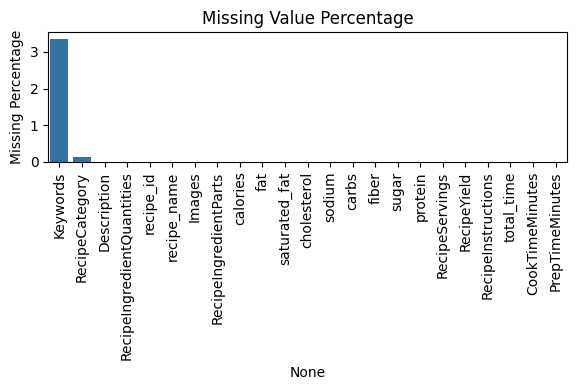

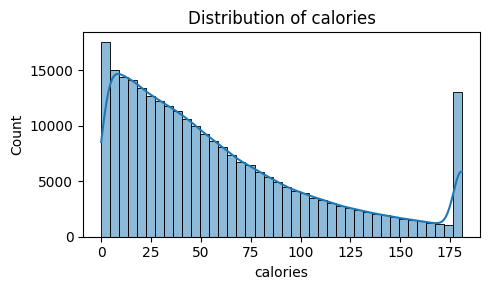

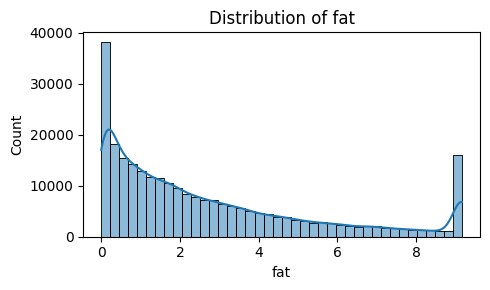

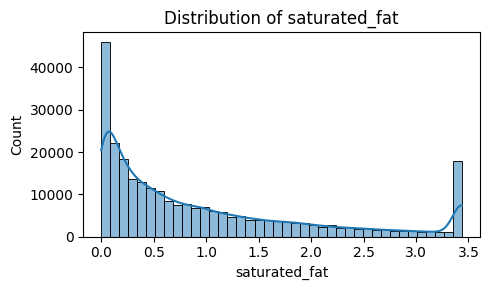

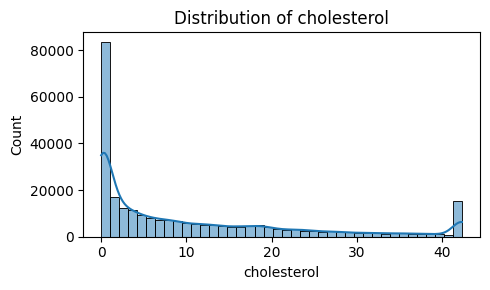

...

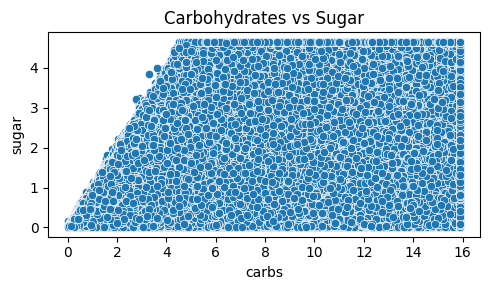

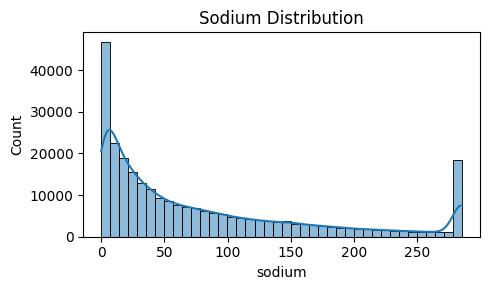

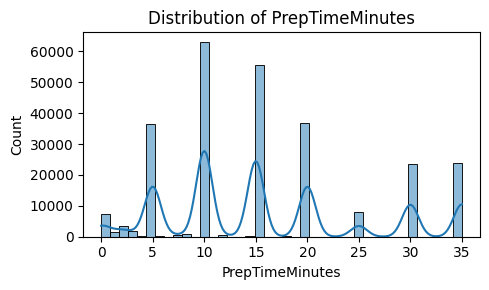

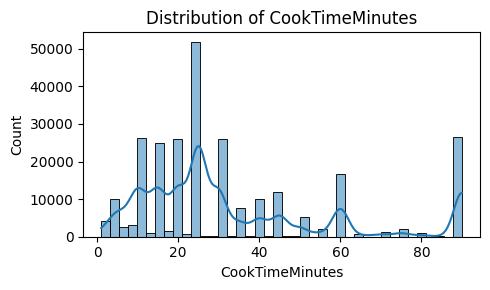

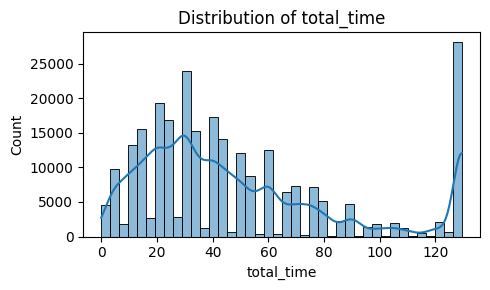

ZERO VALUE ANALYSIS
calories: 0.66%
fat: 2.55%
saturated_fat: 5.76%
cholesterol: 20.80%
sodium: 0.64%
carbs: 1.25%
fiber: 5.20%
sugar: 2.59%
protein: 1.78%
OUTLIER ANALYSIS
calories: 0.00% outliers
fat: 0.00% outliers
saturated_fat: 0.00% outliers
cholesterol: 0.00% outliers
sodium: 0.00% outliers
carbs: 0.00% outliers
fiber: 0.00% outliers
sugar: 0.00% outliers
protein: 0.00% outliers


In [24]:
plt.style.use("default")
nutrition_cols = [
    "calories",
    "fat",
    "saturated_fat",
    "cholesterol",
    "sodium",
    "carbs",
    "fiber",
    "sugar",
    "protein"
]
categorical_cols = [
    "RecipeCategory"
]

print("RECIPE DATASET INFO")
print(df_recipes.info())

print("\nMissing Values:")
print(df_recipes.isnull().sum())

print("\nDuplicate Rows:")
print(df_recipes.duplicated().sum())

print("\nDataset Shape:")
print(df_recipes.shape)

print("NUMERICAL SUMMARY")
print(df_recipes[nutrition_cols].describe())
print("SKEWNESS")
for col in nutrition_cols:
    print(f"{col}: {df_recipes[col].skew():.2f}")

# Missing percentage
missing_pct = (
    df_recipes.isnull()
    .mean()
    .sort_values(ascending=False) * 100)
plt.figure(figsize=(6,4))
sns.barplot(
    x=missing_pct.index,
    y=missing_pct.values)
plt.xticks(rotation=90)
plt.ylabel("Missing Percentage")
plt.title("Missing Value Percentage")
plt.tight_layout()
plt.show()

# Distribution plots
for col in nutrition_cols:
    plt.figure(figsize=(5,3))
    sns.histplot(
        df_recipes[col],
        kde=True,
        bins=40
    )
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.tight_layout()
    plt.show()

# Boxplot outlier analysis
for col in nutrition_cols:
    plt.figure(figsize=(5,3))
    sns.boxplot(
        x=df_recipes[col])
    plt.title(f"Boxplot of {col}")
    plt.tight_layout()
    plt.show()

# Correlation matrix
corr_matrix = (
    df_recipes[nutrition_cols]
    .corr())
plt.figure(figsize=(6,4))
sns.heatmap(
    corr_matrix,
    annot=True,
    cmap="coolwarm",
    fmt=".2f"
)
plt.title("Nutrition Correlation Matrix")
plt.tight_layout()
plt.show()

# Calories vs protein
plt.figure(figsize=(5,3))
sns.scatterplot(
    data=df_recipes,
    x="protein",
    y="calories")
plt.title("Protein vs Calories")
plt.tight_layout()
plt.show()

# Fat vs calories
plt.figure(figsize=(5,3))
sns.scatterplot(
    data=df_recipes,
    x="fat",
    y="calories")
plt.title("Fat vs Calories")
plt.tight_layout()
plt.show()

# Carbs vs sugar
plt.figure(figsize=(5,3))
sns.scatterplot(
    data=df_recipes,
    x="carbs",
    y="sugar")
plt.title("Carbohydrates vs Sugar")
plt.tight_layout()
plt.show()

# Sodium distribution
plt.figure(figsize=(5,3))
sns.histplot(
    df_recipes["sodium"],
    kde=True,
    bins=40)
plt.title("Sodium Distribution")
plt.tight_layout()
plt.show()

# Cooking time analysis
time_cols = [
    "PrepTimeMinutes",
    "CookTimeMinutes",
    "total_time"]
for col in time_cols:
    plt.figure(figsize=(5,3))
    sns.histplot(
        df_recipes[col],
        kde=True,
        bins=40)
    plt.title(f"Distribution of {col}")
    plt.tight_layout()
    plt.show()

# Zero-value analysis
print("ZERO VALUE ANALYSIS")
for col in nutrition_cols:
    zero_pct = (
        (df_recipes[col] == 0)
        .mean() * 100)
    print(f"{col}: {zero_pct:.2f}%")

# Potential outlier detection (IQR)
print("OUTLIER ANALYSIS")
for col in nutrition_cols:
    Q1 = df_recipes[col].quantile(0.25)
    Q3 = df_recipes[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - (1.5 * IQR)
    upper = Q3 + (1.5 * IQR)
    outlier_pct = (
        (
            (df_recipes[col] < lower) |
            (df_recipes[col] > upper)
        ).mean() * 100)
    print(
        f"{col}: {outlier_pct:.2f}% outliers")

### Feature Engineering Recipe

In [25]:

df_recipe_fe = df_recipes.copy()
df_recipe_fe["RecipeCategory"] = (
    df_recipe_fe["RecipeCategory"]
    .fillna("Unknown")
)
df_recipe_fe["Keywords"] = (
    df_recipe_fe["Keywords"]
    .fillna("")
)
df_recipe_fe["Description"] = (
    df_recipe_fe["Description"]
    .fillna("No Description")
)

epsilon = 1e-6
density_features = {
    "protein_density": "protein",
    "fiber_density": "fiber",
    "sugar_density": "sugar",
    "sodium_density": "sodium",
    "fat_density": "fat",
    "carb_density": "carbs",
    "cholesterol_density": "cholesterol"
}

for new_col, base_col in density_features.items():
    df_recipe_fe[new_col] = (
        df_recipe_fe[base_col] /
        (df_recipe_fe["calories"] + epsilon)
    )

df_recipe_fe["protein_to_carb_ratio"] = (
    df_recipe_fe["protein"] /
    (df_recipe_fe["carbs"] + epsilon)
)

df_recipe_fe["fiber_to_carb_ratio"] = (
    df_recipe_fe["fiber"] /
    (df_recipe_fe["carbs"] + epsilon)
)

df_recipe_fe["sugar_to_carb_ratio"] = (
    df_recipe_fe["sugar"] /
    (df_recipe_fe["carbs"] + epsilon)
)

df_recipe_fe["satfat_to_fat_ratio"] = (
    df_recipe_fe["saturated_fat"] /
    (df_recipe_fe["fat"] + epsilon)
)

df_recipe_fe["calorie_category"] = pd.cut(
    df_recipe_fe["calories"],
    bins=[0, 40, 80, 120, 300],
    labels=[
        "Very Low",
        "Low",
        "Moderate",
        "High"
    ]
)

df_recipe_fe["protein_category"] = pd.cut(
    df_recipe_fe["protein"],
    bins=[0, 2, 5, 8, 20],
    labels=[
        "Very Low",
        "Low",
        "Moderate",
        "High"
    ]
)

df_recipe_fe["meal_time_category"] = pd.cut(
    df_recipe_fe["total_time"],
    bins=[0, 15, 30, 60, 1000],
    labels=[
        "Quick",
        "Medium",
        "Long",
        "Very Long"
    ]
)

df_recipe_fe["weight_loss_friendly"] = (
    (df_recipe_fe["calories"] <= 80) &
    (df_recipe_fe["fiber_density"] >= 0.008) &
    (df_recipe_fe["sugar_density"] <= 0.03)
).astype(int)

df_recipe_fe["muscle_gain_friendly"] = (
    df_recipe_fe["protein_density"] >= 0.08
).astype(int)

df_recipe_fe["diabetes_friendly"] = (
    (df_recipe_fe["sugar_density"] <= 0.03)
    & (df_recipe_fe["fiber_density"] >= 0.004)
    & (df_recipe_fe["carbs"] <= 10)
).astype(int)

df_recipe_fe["hypertension_friendly"] = (
    df_recipe_fe["sodium"] <= 140
).astype(int)

df_recipe_fe["heart_healthy"] = (
    df_recipe_fe["satfat_to_fat_ratio"] <= 0.35
).astype(int)

ingredients = (
    df_recipe_fe["RecipeIngredientParts"]
    .fillna("")
    .str.lower()
)

allergen_patterns = {
    "contains_egg": r"\begg\b",
    "contains_milk": r"milk|cheese|cream|butter|yogurt",
    "contains_gluten": r"wheat|bread|flour|pasta|noodle",
    "contains_soy": r"soy|soy sauce|tofu",
    "contains_peanut": r"peanut|groundnut",
    "contains_seafood": r"fish|shrimp|crab|lobster|salmon|tuna"
}

for col, pattern in allergen_patterns.items():
    df_recipe_fe[col] = (
        ingredients
        .str.contains(
            pattern,
            regex=True,
            na=False
        )
        .astype(int)
    )

df_recipe_fe["nutrition_quality_score"] = (
    (df_recipe_fe["protein_density"] * 3)
    + (df_recipe_fe["fiber_density"] * 3)
    - (df_recipe_fe["sugar_density"] * 2)
    - (np.log1p(df_recipe_fe["sodium_density"]) * 1.5)
)

print("Shape:")
print(df_recipe_fe.shape)

new_cols = sorted(
    list(
        set(df_recipe_fe.columns)
        - set(df_recipes.columns)
    )
)

print("\nNew Features Added:")
print(new_cols)

print("\nPreview:")
print(df_recipe_fe.head())

Shape:
(264850, 49)

New Features Added:
['calorie_category', 'carb_density', 'cholesterol_density', 'contains_egg', 'contains_gluten', 'contains_milk', 'contains_peanut', 'contains_seafood', 'contains_soy', 'diabetes_friendly', 'fat_density', 'fiber_density', 'fiber_to_carb_ratio', 'heart_healthy', 'hypertension_friendly', 'meal_time_category', 'muscle_gain_friendly', 'nutrition_quality_score', 'protein_category', 'protein_density', 'protein_to_carb_ratio', 'satfat_to_fat_ratio', 'sodium_density', 'sugar_density', 'sugar_to_carb_ratio', 'weight_loss_friendly']

Preview:
   recipe_id                                 recipe_name  \
0         38           Low-Fat Berry Blue Frozen Dessert   
1         39                                     Biryani   
2         42                                Cabbage Soup   
3         43                        Best Blackbottom Pie   
4         45  Buttermilk Pie With Gingersnap Crumb Crust   

                                         Description  \
0  Ma

In [ ]:
df_recipe_fe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 264850 entries, 0 to 264849
Data columns (total 49 columns):
 #   Column                      Non-Null Count   Dtype   
---  ------                      --------------   -----   
 0   recipe_id                   264850 non-null  int64   
 1   recipe_name                 264850 non-null  object  
 2   Description                 264850 non-null  object  
 3   Images                      264850 non-null  object  
 4   RecipeCategory              264850 non-null  object  
 5   Keywords                    264850 non-null  object  
 6   RecipeIngredientQuantities  264849 non-null  object  
 7   RecipeIngredientParts       264850 non-null  object  
 8   calories                    264850 non-null  float64 
 9   fat                         264850 non-null  float64 
 10  saturated_fat               264850 non-null  float64 
 11  cholesterol                 264850 non-null  float64 
 12  sodium                      264850 non-null  float64 
 13 

### Visualisasi hasil feature engineering

FEATURE ENGINEERING ANALYSIS

Friendly Food Percentage
weight_loss_friendly: 17.25%
muscle_gain_friendly: 11.72%
diabetes_friendly: 30.67%
hypertension_friendly: 78.54%
heart_healthy: 51.38%

Allergen Presence Percentage
contains_egg: 7.61%
contains_milk: 57.16%
contains_gluten: 26.25%
contains_soy: 5.97%
contains_peanut: 2.03%
contains_seafood: 5.44%


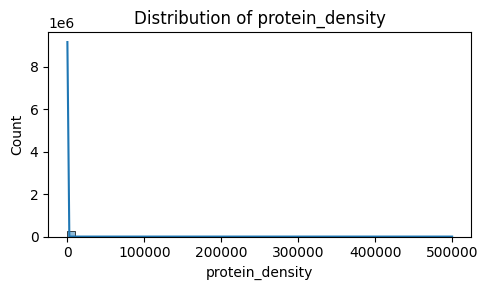

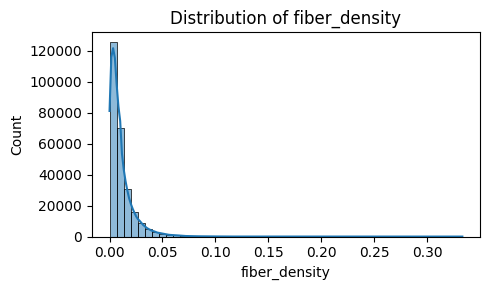

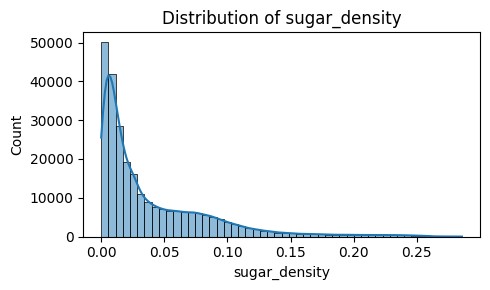

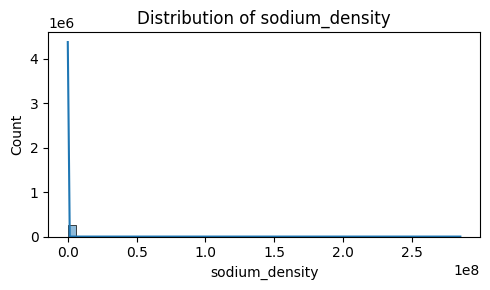

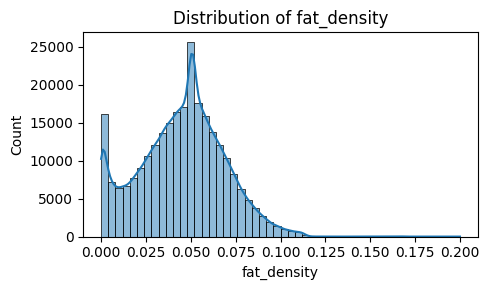

...

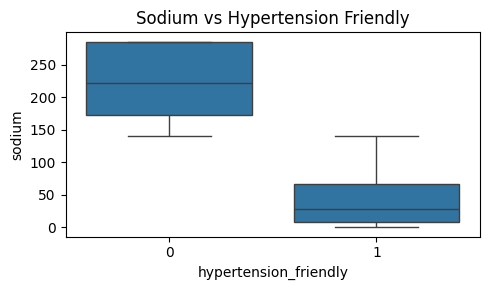

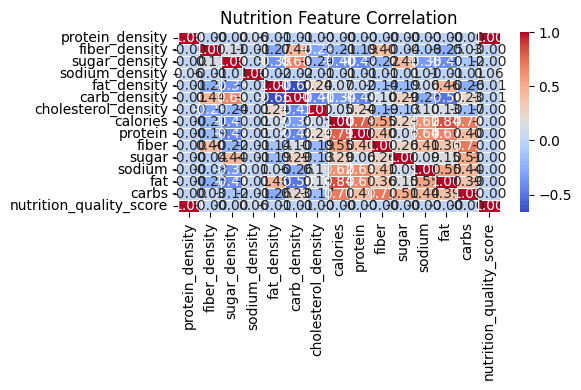

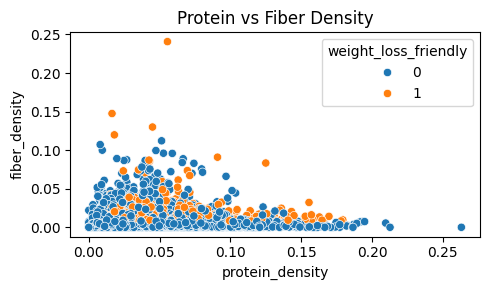

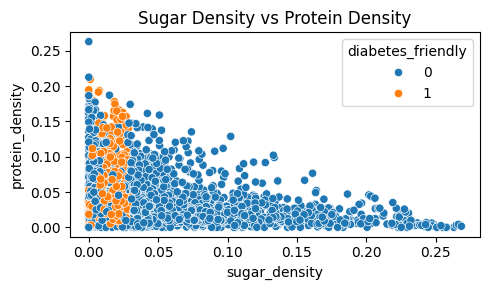

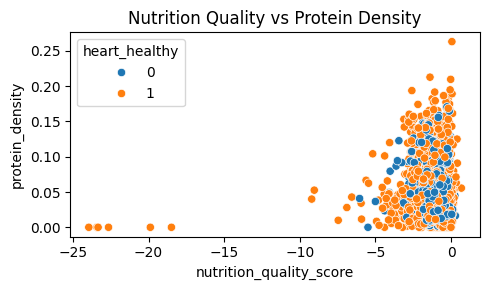

In [26]:
plt.style.use("default")
density_cols = [
    "protein_density",
    "fiber_density",
    "sugar_density",
    "sodium_density",
    "fat_density",
    "carb_density",
    "cholesterol_density"
]
score_cols = [
    "nutrition_quality_score",
    "macro_balance_score",
    "satiety_score"
]
friendly_cols = [
    "weight_loss_friendly",
    "muscle_gain_friendly",
    "diabetes_friendly",
    "hypertension_friendly",
    "heart_healthy"
]
allergy_cols = [
    "contains_egg",
    "contains_milk",
    "contains_gluten",
    "contains_soy",
    "contains_peanut",
    "contains_seafood"
]

# Keep only existing columns
density_cols = [
    col for col in density_cols
    if col in df_recipe_fe.columns
]
score_cols = [
    col for col in score_cols
    if col in df_recipe_fe.columns
]
friendly_cols = [
    col for col in friendly_cols
    if col in df_recipe_fe.columns
]
allergy_cols = [
    col for col in allergy_cols
    if col in df_recipe_fe.columns
]

print("FEATURE ENGINEERING ANALYSIS")
print("\nFriendly Food Percentage")

for col in friendly_cols:
    print(
        f"{col}: "
        f"{df_recipe_fe[col].mean()*100:.2f}%"
    )
print("\nAllergen Presence Percentage")

for col in allergy_cols:
    print(
        f"{col}: "
        f"{df_recipe_fe[col].mean()*100:.2f}%"
    )

for col in density_cols:
    plt.figure(figsize=(5,3))
    sns.histplot(
        df_recipe_fe[col],
        kde=True,
        bins=50
    )
    plt.title(f"Distribution of {col}")
    plt.tight_layout()
    plt.show()

for col in score_cols:
    plt.figure(figsize=(5,3))
    sns.histplot(
        df_recipe_fe[col],
        kde=True,
        bins=50
    )
    plt.title(f"Distribution of {col}")
    plt.tight_layout()
    plt.show()

friendly_counts = (
    df_recipe_fe[friendly_cols]
    .mean()
    .sort_values(ascending=False)
    * 100
)

plt.figure(figsize=(5,3))
sns.barplot(
    x=friendly_counts.index,
    y=friendly_counts.values
)

plt.title("Health-Friendly Recipe Percentage")
plt.ylabel("Percentage (%)")
plt.xticks(rotation=20)
plt.tight_layout()
plt.show()

allergy_counts = (
    df_recipe_fe[allergy_cols]
    .mean()
    .sort_values(ascending=False)
    * 100
)

plt.figure(figsize=(5,3))
sns.barplot(
    x=allergy_counts.index,
    y=allergy_counts.values
)

plt.title("Allergen Distribution")
plt.ylabel("Percentage (%)")
plt.xticks(rotation=20)
plt.tight_layout()
plt.show()

rule_vis = [
    ("weight_loss_friendly",
        "calories",
        "Calories vs Weight Loss Friendly"),
    ("muscle_gain_friendly",
        "protein",
        "Protein vs Muscle Gain Friendly"),
    ("diabetes_friendly",
        "sugar",
        "Sugar vs Diabetes Friendly"),
    ("hypertension_friendly",
        "sodium",
        "Sodium vs Hypertension Friendly")
]
for x_col, y_col, title in rule_vis:
    if (
        x_col in df_recipe_fe.columns
        and y_col in df_recipe_fe.columns
    ):
        plt.figure(figsize=(5,3))
        sns.boxplot(
            x=x_col,
            y=y_col,
            data=df_recipe_fe
        )
        plt.title(title)
        plt.tight_layout()
        plt.show()

corr_cols = density_cols + [
    col for col in [
        "calories",
        "protein",
        "fiber",
        "sugar",
        "sodium",
        "fat",
        "carbs",
        "nutrition_quality_score",
        "macro_balance_score",
        "satiety_score"
    ]
    if col in df_recipe_fe.columns
]

plt.figure(figsize=(6,4))
corr_matrix = (
    df_recipe_fe[corr_cols]
    .corr()
)

sns.heatmap(
    corr_matrix,
    annot=True,
    cmap="coolwarm",
    fmt=".2f",
    linewidths=0.5
)

plt.title("Nutrition Feature Correlation")
plt.tight_layout()
plt.show()
sample_df = df_recipe_fe.sample(
    min(5000, len(df_recipe_fe)),
    random_state=42
)
if (
    "protein_density" in df_recipe_fe.columns
    and "fiber_density" in df_recipe_fe.columns
):
    plt.figure(figsize=(5,3))

    sns.scatterplot(
        x="protein_density",
        y="fiber_density",
        hue="weight_loss_friendly",
        data=sample_df
    )
    plt.title("Protein vs Fiber Density")
    plt.tight_layout()
    plt.show()
if (
    "sugar_density" in df_recipe_fe.columns
    and "protein_density" in df_recipe_fe.columns
):
    plt.figure(figsize=(5,3))
    sns.scatterplot(
        x="sugar_density",
        y="protein_density",
        hue="diabetes_friendly",
        data=sample_df
    )
    plt.title(
        "Sugar Density vs Protein Density"
    )
    plt.tight_layout()
    plt.show()
if (
    "nutrition_quality_score"
    in df_recipe_fe.columns
):
    plt.figure(figsize=(5,3))
    sns.scatterplot(
        x="nutrition_quality_score",
        y="protein_density",
        hue="heart_healthy",
        data=sample_df
    )
    plt.title(
        "Nutrition Quality vs Protein Density"
    )
    plt.tight_layout()
    plt.show()


In [ ]:
rule_check = {
    "Weight Loss": "weight_loss_friendly",
    "Muscle Gain": "muscle_gain_friendly",
    "Diabetes": "diabetes_friendly",
    "Hypertension": "hypertension_friendly"
}

for label, col in rule_check.items():
    print("=" * 50)
    print(label)

    print(
        df_recipe_fe.groupby(col)[
            [
                "calories",
                "protein",
                "sugar",
                "sodium",
                "fiber"
            ]
        ].mean()
    )

Weight Loss
                       calories   protein     sugar     sodium     fiber
weight_loss_friendly                                                    
0                     62.734813  2.982100  1.582033  82.466366  0.465585
1                     38.834876  1.903908  0.562823  70.536650  0.690200
Muscle Gain
                       calories   protein     sugar      sodium     fiber
muscle_gain_friendly                                                     
0                     58.602777  2.365381  1.470633   76.701149  0.520870
1                     58.681011  6.039023  0.921208  108.320406  0.379821
Diabetes
                    calories   protein     sugar     sodium     fiber
diabetes_friendly                                                    
0                  60.699439  2.725136  1.727590  76.199750  0.458504
1                  53.893442  2.956525  0.679783  89.921617  0.607922
Hypertension
                         calories   protein     sugar      sodium     fiber
hypertensi

### Dataset Integration

tidak perlu dijalankan ulang karena hasil datasetnya sudah di download dan dilanjutkan dari path.

In [34]:
import pandas as pd
import numpy as np
import random

random.seed(42)
np.random.seed(42)

interaction_rows = []

positive_target = 8
negative_target = 12

for _, user in df_encoded.iterrows():

    candidate_recipes = df_recipe_fe.copy()

    allergy_filters = {
        "allergy_Egg": "contains_egg",
        "allergy_Milk": "contains_milk",
        "allergy_Gluten": "contains_gluten",
        "allergy_Peanut": "contains_peanut",
        "allergy_Seafood": "contains_seafood",
        "allergy_Soy": "contains_soy"
    }

    for allergy_col, recipe_col in allergy_filters.items():
        if user.get(allergy_col, 0) == 1:
            candidate_recipes = candidate_recipes[
                candidate_recipes[recipe_col] == 0
            ]

    if len(candidate_recipes) == 0:
        continue

    candidate_recipes = candidate_recipes.copy()

    scores = np.zeros(len(candidate_recipes))

    # Medical compatibility
    if user["has_diabetes"] == 1:
        scores += (
            candidate_recipes[
                "diabetes_friendly"
            ] * 2
        )

        scores += np.where(
            candidate_recipes[
                "sugar_density"
            ] <= 0.03,
            1,
            0
        )

    if user["has_hypertension"] == 1:
        scores += (
            candidate_recipes[
                "hypertension_friendly"
            ] * 2
        )

        scores += np.where(
            candidate_recipes[
                "sodium_density"
            ] <= 1.5,
            1,
            0
        )

    if user["has_high_cholesterol"] == 1:
        scores += (
            candidate_recipes[
                "heart_healthy"
            ] * 2
        )

    # Goal compatibility
    if user["primary_goal_Weight Loss"] == 1:

        scores += (
            candidate_recipes[
                "weight_loss_friendly"
            ] * 2
        )

        scores += np.where(
            candidate_recipes[
                "fiber_density"
            ] >= 0.008,
            1,
            0
        )

    elif user["primary_goal_Muscle Gain"] == 1:

        scores += (
            candidate_recipes[
                "muscle_gain_friendly"
            ] * 2
        )

        scores += np.where(
            candidate_recipes[
                "protein_density"
            ] >= 0.08,
            1,
            0
        )

    else:
        scores += np.select(
    [
        candidate_recipes[
            "nutrition_quality_score"
        ] > -0.05,

        candidate_recipes[
            "nutrition_quality_score"
        ] > -0.15
    ],
    [
        2,
        1
    ],
    default=-2
)

    # Calorie compatibility
    meal_target = user["TDEE"] / 3

    calorie_gap = abs(
        candidate_recipes["calories"]
        - meal_target
    )

    scores += np.where(
        calorie_gap <= 250,
        2,
        np.where(
            calorie_gap <= 450,
            1,
            0
        )
    )

    # General nutrition bonus
    scores += np.where(
        candidate_recipes[
            "nutrition_quality_score"
        ] > -2,
        1,
        0
    )

    candidate_recipes[
        "interaction_score"
    ] = scores

    # Threshold lebih longgar
    candidate_recipes[
        "label"
    ] = np.where(
        scores >= 3,
        1,
        0
    )

    positive_pool = candidate_recipes[
        candidate_recipes["label"] == 1
    ]

    negative_pool = candidate_recipes[
        candidate_recipes["label"] == 0
    ]

    # Dynamic fallback
    if len(positive_pool) < positive_target:

        extra_positive = (
            candidate_recipes
            .sort_values(
                "interaction_score",
                ascending=False
            )
            .head(positive_target)
        )

        positive_sample = extra_positive.sample(
            n=positive_target,
            replace=len(extra_positive)
            < positive_target,
            random_state=42
        )

    else:

        positive_sample = positive_pool.sample(
            n=positive_target,
            replace=False,
            random_state=42
        )

    if len(negative_pool) < negative_target:

        extra_negative = (
            candidate_recipes
            .sort_values(
                "interaction_score",
                ascending=True
            )
            .head(negative_target)
        )

        negative_sample = extra_negative.sample(
            n=negative_target,
            replace=len(extra_negative)
            < negative_target,
            random_state=42
        )

    else:

        negative_sample = negative_pool.sample(
            n=negative_target,
            replace=False,
            random_state=42
        )

    sampled = pd.concat([
        positive_sample,
        negative_sample
    ])

    recipe_cols = [
        "recipe_id",
        "calories",
        "protein",
        "fat",
        "carbs",
        "fiber",
        "sugar",
        "sodium",
        "protein_density",
        "fiber_density",
        "sugar_density",
        "sodium_density",
        "nutrition_quality_score",
        "weight_loss_friendly",
        "muscle_gain_friendly",
        "diabetes_friendly",
        "hypertension_friendly",
        "heart_healthy",
        "interaction_score",
        "label"
    ]

    for _, recipe in sampled.iterrows():

        row = user.to_dict()

        for col in recipe_cols:
            row[f"recipe_{col}"] = recipe[col]

        interaction_rows.append(row)

df_interactions = pd.DataFrame(
    interaction_rows
)

print("Shape:")
print(df_interactions.shape)

print("\nLabel Distribution:")
print(
    df_interactions[
        "recipe_label"
    ].value_counts(normalize=True)
    * 100
)

df_interactions.head()

KeyboardInterrupt: 

In [ ]:
output_path = "df_interactions2.csv"

df_interactions.to_csv(
    output_path,
    index=False
)

print(f"Saved to: {output_path}")

### Load Dataset Integration

In [35]:
df_interactions = pd.read_csv(
    r"D:\BELAJAR DI LUAR KAMPUS\DBS\CAPSTONE\AI_PROJECT\AI_PROJECT\df_interactions2.csv"
)

In [36]:
df_interactions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Data columns (total 65 columns):
 #   Column                            Non-Null Count   Dtype  
---  ------                            --------------   -----  
 0   age                               200000 non-null  float64
 1   height                            200000 non-null  float64
 2   BMI                               200000 non-null  float64
 3   blood_pressure_systolic           200000 non-null  float64
 4   blood_pressure_diastolic          200000 non-null  float64
 5   heart_rate                        200000 non-null  float64
 6   daily_water_intake_goal           200000 non-null  float64
 7   avg_sleep_hours                   200000 non-null  float64
 8   commitment_days                   200000 non-null  float64
 9   target_weight_kg                  200000 non-null  float64
 10  TDEE                              200000 non-null  float64
 11  water_ml_per_kg                   200000 non-null  f

In [38]:
print(df_interactions["recipe_label"].value_counts())

print(
    df_interactions["recipe_label"]
    .value_counts(normalize=True)
    * 100
)

recipe_label
0    143440
1     56560
Name: count, dtype: int64
recipe_label
0    71.72
1    28.28
Name: proportion, dtype: float64


### Splitting

In [39]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

target_col = "recipe_label"

drop_cols = [
    "recipe_recipe_id",
    "recipe_interaction_score",
    "recipe_label"
]

X = df_interactions.drop(
    columns=drop_cols
)

y = df_interactions[target_col]

X_train, X_temp, y_train, y_temp = train_test_split(
    X,
    y,
    test_size=0.30,
    random_state=42,
    stratify=y
)

X_val, X_test, y_val, y_test = train_test_split(
    X_temp,
    y_temp,
    test_size=0.50,
    random_state=42,
    stratify=y_temp
)

print("Train:", X_train.shape)
print("Validation:", X_val.shape)
print("Test:", X_test.shape)

numeric_cols = X_train.select_dtypes(
    include=["float64", "int64"]
).columns

scaler = StandardScaler()

X_train[numeric_cols] = scaler.fit_transform(
    X_train[numeric_cols]
)

X_val[numeric_cols] = scaler.transform(
    X_val[numeric_cols]
)

X_test[numeric_cols] = scaler.transform(
    X_test[numeric_cols]
)

print("\nScaling completed")

Train: (140000, 62)
Validation: (30000, 62)
Test: (30000, 62)

Scaling completed


In [40]:
from sklearn.preprocessing import StandardScaler

continuous_cols = [
    "age",
    "height",
    "BMI",
    "blood_pressure_systolic",
    "blood_pressure_diastolic",
    "heart_rate",
    "daily_water_intake_goal",
    "avg_sleep_hours",
    "commitment_days",
    "target_weight_kg",
    "TDEE",
    "water_ml_per_kg",
    "activity_score",
    "calorie_gap",
    "target_weight_change",
    "target_weight_change_pct",
    "health_risk_score",

    "recipe_calories",
    "recipe_protein",
    "recipe_fat",
    "recipe_carbs",
    "recipe_fiber",
    "recipe_sugar",
    "recipe_sodium",

    "recipe_protein_density",
    "recipe_fiber_density",
    "recipe_sugar_density",
    "recipe_sodium_density",
    "recipe_nutrition_quality_score"
]

existing_cols = [
    col for col in continuous_cols
    if col in X_train.columns
]

scaler = StandardScaler()

X_train_scaled = X_train.copy()
X_val_scaled = X_val.copy()
X_test_scaled = X_test.copy()

X_train_scaled[existing_cols] = scaler.fit_transform(
    X_train[existing_cols]
)

X_val_scaled[existing_cols] = scaler.transform(
    X_val[existing_cols]
)

X_test_scaled[existing_cols] = scaler.transform(
    X_test[existing_cols]
)

print("Scaling completed")

print("\nScaled features:")
print(existing_cols)

print("\nTrain shape:")
print(X_train_scaled.shape)

print("\nValidation shape:")
print(X_val_scaled.shape)

print("\nTest shape:")
print(X_test_scaled.shape)

Scaling completed

Scaled features:
['age', 'height', 'BMI', 'blood_pressure_systolic', 'blood_pressure_diastolic', 'heart_rate', 'daily_water_intake_goal', 'avg_sleep_hours', 'commitment_days', 'target_weight_kg', 'TDEE', 'water_ml_per_kg', 'activity_score', 'calorie_gap', 'target_weight_change', 'target_weight_change_pct', 'health_risk_score', 'recipe_calories', 'recipe_protein', 'recipe_fat', 'recipe_carbs', 'recipe_fiber', 'recipe_sugar', 'recipe_sodium', 'recipe_protein_density', 'recipe_fiber_density', 'recipe_sugar_density', 'recipe_sodium_density', 'recipe_nutrition_quality_score']

Train shape:
(140000, 62)

Validation shape:
(30000, 62)

Test shape:
(30000, 62)


In [41]:
print(
    X_train_scaled[existing_cols]
    .describe()
    .loc[["mean", "std"]]
)

               age        height           BMI  blood_pressure_systolic  \
mean  1.579689e-17  2.413308e-17 -1.408397e-17             1.516247e-17   
std   1.000004e+00  1.000004e+00  1.000004e+00             1.000004e+00   

      blood_pressure_diastolic    heart_rate  daily_water_intake_goal  \
mean              3.984115e-18 -2.527502e-17             1.329730e-17   
std               1.000004e+00  1.000004e+00             1.000004e+00   

      avg_sleep_hours  commitment_days  target_weight_kg  ...    recipe_fat  \
mean     3.070560e-18     1.895627e-17      2.790149e-17  ...  1.015061e-19   
std      1.000004e+00     1.000004e+00      1.000004e+00  ...  1.000004e+00   

      recipe_carbs  recipe_fiber  recipe_sugar  recipe_sodium  \
mean -1.015061e-18 -1.966681e-17  1.573345e-18   3.679596e-18   
std   1.000004e+00  1.000004e+00  1.000004e+00   1.000004e+00   

      recipe_protein_density  recipe_fiber_density  recipe_sugar_density  \
mean           -7.815970e-18          1.2992

### Leakage Checking

In [42]:
print(X_train.columns.tolist())

['age', 'height', 'BMI', 'blood_pressure_systolic', 'blood_pressure_diastolic', 'heart_rate', 'daily_water_intake_goal', 'avg_sleep_hours', 'commitment_days', 'target_weight_kg', 'TDEE', 'water_ml_per_kg', 'activity_score', 'calorie_gap', 'target_weight_change', 'target_weight_change_pct', 'health_risk_score', 'activity_level_encoded', 'sleep_quality_encoded', 'bmi_category_encoded', 'bp_category_encoded', 'age_group_encoded', 'gender_encoded', 'has_diabetes', 'has_hypertension', 'has_asthma', 'has_high_cholesterol', 'medical_unknown', 'no_medical_history', 'allergy_Egg', 'allergy_Gluten', 'allergy_Milk', 'allergy_No Allergy', 'allergy_Peanut', 'allergy_Seafood', 'allergy_Soy', 'primary_goal_Healthy Lifestyle', 'primary_goal_Maintenance', 'primary_goal_Muscle Gain', 'primary_goal_Weight Loss', 'dietary_restriction_Balanced', 'dietary_restriction_High Protein', 'dietary_restriction_Low Calorie', 'dietary_restriction_Low Sodium', 'dietary_restriction_Low Sugar', 'recipe_calories', 'recip

In [43]:
print("Jumlah kolom X_train:")
print(len(X_train.columns))

print("\nJumlah kolom X_test_scaled:")
print(len(X_test_scaled.columns))

extra_cols = set(
    X_test_scaled.columns
) - set(
    X_train.columns
)

print("\nExtra Columns:")
print(extra_cols)

Jumlah kolom X_train:
62

Jumlah kolom X_test_scaled:
62

Extra Columns:
set()


In [44]:
leakage_cols = [
    "recipe_weight_loss_friendly",
    "recipe_muscle_gain_friendly",
    "recipe_diabetes_friendly",
    "recipe_hypertension_friendly",
    "recipe_heart_healthy"
]

X_train = X_train.drop(
    columns=leakage_cols,
    errors="ignore"
)

X_val = X_val.drop(
    columns=leakage_cols,
    errors="ignore"
)

X_test = X_test.drop(
    columns=leakage_cols,
    errors="ignore"
)

print(X_train.shape)

(140000, 57)


In [45]:
X_test_scaled = X_test_scaled[
    X_train.columns
]

print(X_test_scaled.shape)

(30000, 57)


### TF Functional API

In [46]:
import tensorflow as tf
from tensorflow.keras.layers import (
    Input,
    Dense,
    Dropout,
    BatchNormalization,
    Concatenate
)
from tensorflow.keras.models import Model

user_cols = [
    col for col in X_train.columns
    if not col.startswith("recipe_")
]

recipe_cols = [
    col for col in X_train.columns
    if col.startswith("recipe_")
]

X_train_user = X_train[user_cols]
X_train_recipe = X_train[recipe_cols]

X_val_user = X_val[user_cols]
X_val_recipe = X_val[recipe_cols]

X_test_user = X_test[user_cols]
X_test_recipe = X_test[recipe_cols]
X_test_recipe = X_test[recipe_cols]

print(X_train_user.shape)
print(X_train_recipe.shape)

(140000, 45)
(140000, 12)


### Feature Cross Custom Layer

In [49]:
class FeatureCrossLayer(tf.keras.layers.Layer):

    def __init__(self):
        super().__init__()

    def call(self, inputs):

        user_embedding, recipe_embedding = inputs

        cross = (
            user_embedding
            * recipe_embedding
        )

        return tf.concat(
            [
                user_embedding,
                recipe_embedding,
                cross
            ],
            axis=1
        )

### Model TensorFlow Functional API

In [50]:
import tensorflow as tf
from tensorflow.keras.layers import (
    Input,
    Dense,
    Dropout,
    BatchNormalization,
    Concatenate
)
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import (
    EarlyStopping,
    ReduceLROnPlateau,
    TensorBoard,
    Callback
)

# Custom callback (MVP requirement)
class StopAtAccuracy(Callback):
    def on_epoch_end(self, epoch, logs=None):
        if logs.get("val_accuracy") >= 0.985:
            print("\nTarget accuracy reached.")
            self.model.stop_training = True


# User branch
user_input = Input(
    shape=(X_train_user.shape[1],),
    name="user_input"
)

x_user = Dense(
    128,
    activation="relu"
)(user_input)

x_user = BatchNormalization()(x_user)
x_user = Dropout(0.3)(x_user)

x_user = Dense(
    64,
    activation="relu"
)(x_user)


# Recipe branch
recipe_input = Input(
    shape=(X_train_recipe.shape[1],),
    name="recipe_input"
)

x_recipe = Dense(
    64,
    activation="relu"
)(recipe_input)

x_recipe = BatchNormalization()(x_recipe)
x_recipe = Dropout(0.3)(x_recipe)

x_recipe = Dense(
    32,
    activation="relu"
)(x_recipe)


# Merge
merged = Concatenate()([
    x_user,
    x_recipe
])

x = Dense(
    64,
    activation="relu"
)(merged)

x = Dropout(0.2)(x)

x = Dense(
    32,
    activation="relu"
)(x)

output = Dense(
    1,
    activation="sigmoid"
)(x)

model = Model(
    inputs=[
        user_input,
        recipe_input
    ],
    outputs=output
)

# Compile with additional metrics
model.compile(
    optimizer=tf.keras.optimizers.Adam(
        learning_rate=0.001
    ),
    loss="binary_crossentropy",
    metrics=[
        "accuracy",
        tf.keras.metrics.AUC(name="auc"),
        tf.keras.metrics.Precision(name="precision"),
        tf.keras.metrics.Recall(name="recall"),
        tf.keras.metrics.BinaryAccuracy(
            name="binary_accuracy"
        ),
        tf.keras.metrics.MeanAbsoluteError(
            name="mae"
        )
    ]
)

model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ user_input          │ (None, 45)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ recipe_input        │ (None, 12)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 128)       │      5,888 │ user_input[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 64)        │        832 │ recipe_input[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 128)       │        512 │ dense[0][0]       │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64)        │        256 │ dense_2[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 128)       │          0 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 64)        │          0 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 64)        │      8,256 │ dropout[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 32)        │      2,080 │ dropout_1[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 96)        │          0 │ dense_1[0][0],    │
│ (Concatenate)       │                   │            │ dense_3[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 64)        │      6,208 │ concatenate[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 64)        │          0 │ dense_4[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_5 (Dense)     │ (None, 32)        │      2,080 │ dropout_2[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_6 (Dense)     │ (None, 1)         │         33 │ dense_5[0][0]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 26,145 (102.13 KB)

 Trainable params: 25,761 (100.63 KB)

 Non-trainable params: 384 (1.50 KB)

In [51]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(
        learning_rate=0.001
    ),
    loss="binary_crossentropy",
    metrics=[
        "accuracy",
        tf.keras.metrics.AUC(name="auc")
    ]
)

In [52]:
early_stop = tf.keras.callbacks.EarlyStopping(
    monitor="val_mae",
    mode="min",
    patience=8,
    restore_best_weights=True,
    min_delta=0.001
)

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor="val_mae",
    mode="min",
    factor=0.5,
    patience=3,
    min_lr=1e-6,
    verbose=1
)

tensorboard_callback = tf.keras.callbacks.TensorBoard(
    log_dir="logs"
)

In [53]:
import datetime
import tensorflow as tf

log_dir = (
    "logs/fit/" +
    datetime.datetime.now().strftime(
        "%Y%m%d-%H%M%S"
    )
)

tensorboard_callback = (
    tf.keras.callbacks.TensorBoard(
        log_dir=log_dir,
        histogram_freq=1,
        write_graph=True,
        write_images=True,
        update_freq="epoch"
    )
)

In [55]:
history = model.fit(
    [
        X_train_user,
        X_train_recipe
    ],
    y_train,

    validation_data=(
        [
            X_val_user,
            X_val_recipe
        ],
        y_val
    ),

    epochs=50,
    batch_size=256,

    callbacks=[
        early_stop,
        reduce_lr,
        tensorboard_callback
    ]
)

Epoch 1/50
538/547 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8383 - auc: 0.8875 - loss: 0.3405

C:\Users\USER\AppData\Roaming\Python\Python311\site-packages\keras\src\callbacks\early_stopping.py:99: UserWarning: Early stopping conditioned on metric `val_mae` which is not available. Available metrics are: accuracy,auc,loss,val_accuracy,val_auc,val_loss
  current = self.get_monitor_value(logs)
C:\Users\USER\AppData\Roaming\Python\Python311\site-packages\keras\src\callbacks\callback_list.py:171: UserWarning: Learning rate reduction is conditioned on metric `val_mae` which is not available. Available metrics are: accuracy,auc,loss,val_accuracy,val_auc,val_loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


547/547 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.8995 - auc: 0.9609 - loss: 0.2228 - val_accuracy: 0.9661 - val_auc: 0.9947 - val_loss: 0.0857 - learning_rate: 0.0010
Epoch 2/50
547/547 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.9560 - auc: 0.9913 - loss: 0.1058 - val_accuracy: 0.9756 - val_auc: 0.9967 - val_loss: 0.0639 - learning_rate: 0.0010
Epoch 3/50
547/547 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.9654 - auc: 0.9943 - loss: 0.0855 - val_accuracy: 0.9771 - val_auc: 0.9977 - val_loss: 0.0554 - learning_rate: 0.0010
Epoch 4/50
547/547 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.9691 - auc: 0.9952 - loss: 0.0768 - val_accuracy: 0.9786 - val_auc: 0.9980 - val_loss: 0.0518 - learning_rate: 0.0010
Epoch 5/50
547/547 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.9713 - auc: 0.9961 - loss: 0.0697 - val_accuracy: 0.9794 - val_auc: 0.9980 - val_loss: 0.0497 - learning_rate: 0.0010
Epoch 6/50
547/547 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.9726 - auc: 0.9964 - loss

In [56]:
%load_ext tensorboard
%tensorboard --logdir logs

### Evaluasi Model

MODEL EVALUATION
Accuracy  : 0.9889
Precision : 0.9808
Recall    : 0.9798
F1 Score  : 0.9803
AUC       : 0.9995
MAE       : 0.0170

MVP CHECK
------------------------------
Accuracy Requirement: PASSED
MAE Requirement: PASSED

Classification Report
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     21516
           1       0.98      0.98      0.98      8484

    accuracy                           0.99     30000
   macro avg       0.99      0.99      0.99     30000
weighted avg       0.99      0.99      0.99     30000



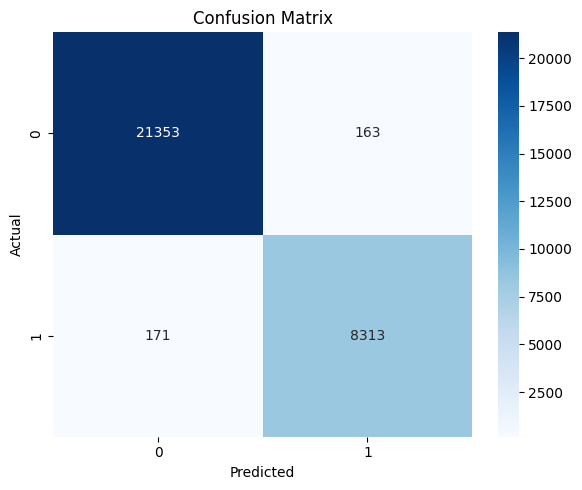

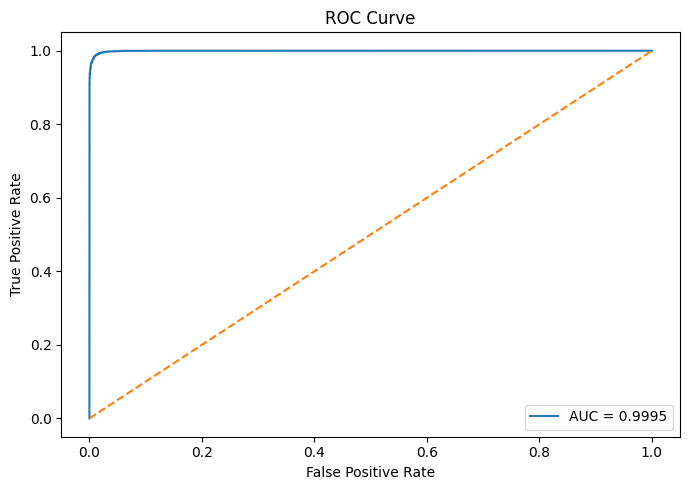

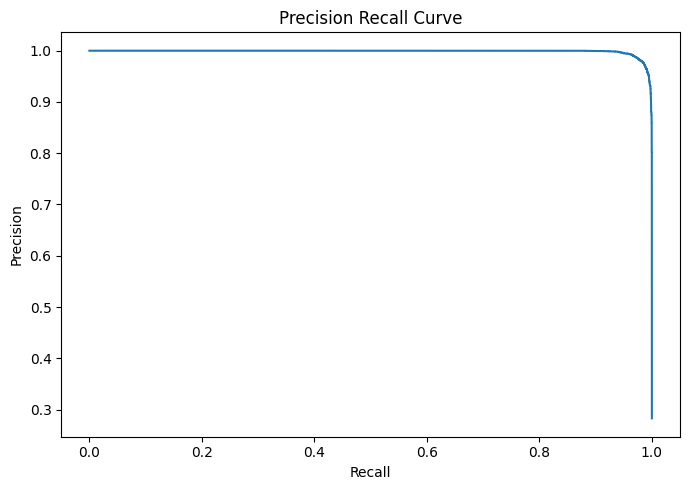

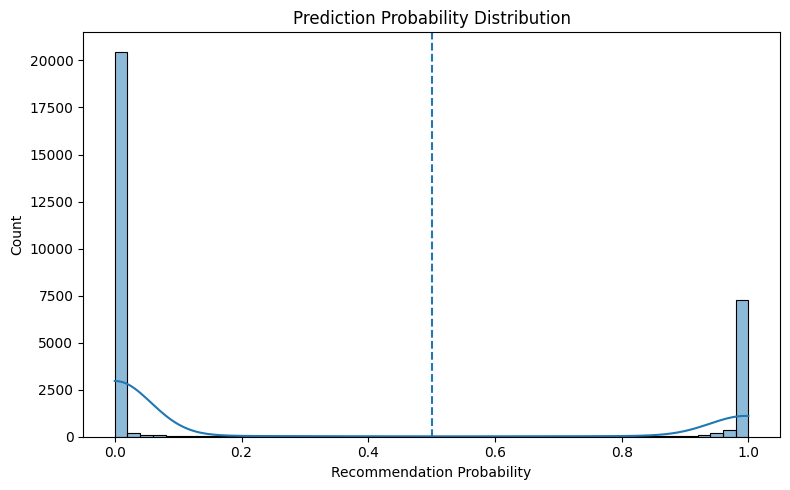


Threshold Analysis


,threshold,accuracy,precision,recall,f1_score
0,0.1,0.978167,0.930401,0.997407,0.962740
1,0.2,0.984467,0.953097,0.993989,0.973113
2,0.3,0.987000,0.965815,0.989038,0.977289
3,0.4,0.988833,0.975493,0.985266,0.980355
4,0.5,0.988867,0.980769,0.979844,0.980307
5,0.6,0.988667,0.985919,0.973833,0.979839
6,0.7,0.987967,0.990105,0.967115,0.978475
7,0.8,0.986167,0.994363,0.956506,0.975068
8,0.9,0.981233,0.998239,0.935290,0.965740


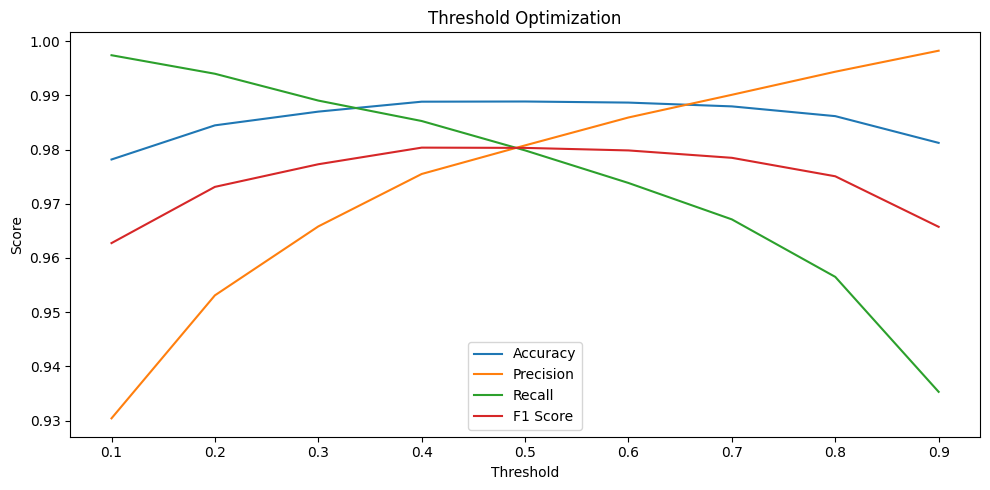

In [58]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    mean_absolute_error,
    confusion_matrix,
    classification_report,
    roc_curve,
    precision_recall_curve
)

print("=" * 60)
print("MODEL EVALUATION")
print("=" * 60)

# Prediction probability
y_pred_prob = model.predict(
    [
        X_test_user,
        X_test_recipe
    ],
    verbose=0
)

y_pred_prob = (
    y_pred_prob
    .flatten()
)

# Binary prediction
threshold = 0.5

y_pred = (
    y_pred_prob >= threshold
).astype(int)

# Metrics
accuracy = accuracy_score(
    y_test,
    y_pred
)

precision = precision_score(
    y_test,
    y_pred
)

recall = recall_score(
    y_test,
    y_pred
)

f1 = f1_score(
    y_test,
    y_pred
)

auc = roc_auc_score(
    y_test,
    y_pred_prob
)

mae = mean_absolute_error(
    y_test,
    y_pred_prob
)

print(f"Accuracy  : {accuracy:.4f}")
print(f"Precision : {precision:.4f}")
print(f"Recall    : {recall:.4f}")
print(f"F1 Score  : {f1:.4f}")
print(f"AUC       : {auc:.4f}")
print(f"MAE       : {mae:.4f}")

print("\nMVP CHECK")
print("-" * 30)

if accuracy >= 0.85:
    print("Accuracy Requirement: PASSED")
else:
    print("Accuracy Requirement: FAILED")

if mae <= 0.02:
    print("MAE Requirement: PASSED")
else:
    print("MAE Requirement: FAILED")

print("\nClassification Report")
print("=" * 60)

print(
    classification_report(
        y_test,
        y_pred
    )
)

# Confusion Matrix
cm = confusion_matrix(
    y_test,
    y_pred
)

plt.figure(figsize=(6, 5))

sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues"
)

plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")

plt.tight_layout()
plt.show()

# ROC Curve
fpr, tpr, _ = roc_curve(
    y_test,
    y_pred_prob
)

plt.figure(figsize=(7, 5))

plt.plot(
    fpr,
    tpr,
    label=f"AUC = {auc:.4f}"
)

plt.plot(
    [0, 1],
    [0, 1],
    linestyle="--"
)

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()

plt.tight_layout()
plt.show()

# Precision Recall Curve
precision_curve, recall_curve, _ = (
    precision_recall_curve(
        y_test,
        y_pred_prob
    )
)

plt.figure(figsize=(7, 5))

plt.plot(
    recall_curve,
    precision_curve
)

plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision Recall Curve")

plt.tight_layout()
plt.show()

# Prediction Distribution
plt.figure(figsize=(8, 5))

sns.histplot(
    y_pred_prob,
    bins=50,
    kde=True
)

plt.axvline(
    threshold,
    linestyle="--"
)

plt.title(
    "Prediction Probability Distribution"
)

plt.xlabel(
    "Recommendation Probability"
)

plt.tight_layout()
plt.show()

# Threshold comparison
thresholds = np.arange(
    0.1,
    1.0,
    0.1
)

results = []

for th in thresholds:

    pred_temp = (
        y_pred_prob >= th
    ).astype(int)

    results.append({
        "threshold": th,
        "accuracy": accuracy_score(
            y_test,
            pred_temp
        ),
        "precision": precision_score(
            y_test,
            pred_temp
        ),
        "recall": recall_score(
            y_test,
            pred_temp
        ),
        "f1_score": f1_score(
            y_test,
            pred_temp
        )
    })

threshold_df = pd.DataFrame(
    results
)

print("\nThreshold Analysis")
print("=" * 60)

display(threshold_df)

# Threshold plot
plt.figure(figsize=(10, 5))

plt.plot(
    threshold_df["threshold"],
    threshold_df["accuracy"],
    label="Accuracy"
)

plt.plot(
    threshold_df["threshold"],
    threshold_df["precision"],
    label="Precision"
)

plt.plot(
    threshold_df["threshold"],
    threshold_df["recall"],
    label="Recall"
)

plt.plot(
    threshold_df["threshold"],
    threshold_df["f1_score"],
    label="F1 Score"
)

plt.xlabel("Threshold")
plt.ylabel("Score")
plt.title("Threshold Optimization")
plt.legend()

plt.tight_layout()
plt.show()

In [59]:
import tensorflow as tf

tf.keras.backend.clear_session()

### Save Model

In [64]:
import os

os.makedirs("saved_model", exist_ok=True)

model.save(
    "saved_model/recipe_recommender.keras"
)

print("Model saved successfully")

Model saved successfully


In [61]:
import joblib
import os

os.makedirs(
    "saved_scaler",
    exist_ok=True
)

joblib.dump(
    scaler,
    "saved_scaler/feature_scaler.pkl"
)

print("Scaler saved successfully")

Scaler saved successfully


### Inference

In [62]:
import re
import joblib
import pandas as pd
import tensorflow as tf
from IPython.display import HTML, display

model = tf.keras.models.load_model(
    "saved_model/recipe_recommender.keras"
)

scaler = joblib.load(
    "saved_scaler/feature_scaler.pkl"
)

feature_order = X_train.columns.tolist()
user_cols = X_train_user.columns.tolist()
recipe_cols = X_train_recipe.columns.tolist()

user_input = {
    "age": 25,
    "height": 170,
    "BMI": 26,
    "blood_pressure_systolic": 120,
    "blood_pressure_diastolic": 80,
    "heart_rate": 75,
    "daily_water_intake_goal": 2500,
    "avg_sleep_hours": 7,
    "commitment_days": 5,
    "target_weight_kg": 65,
    "TDEE": 2200,
    "water_ml_per_kg": 35,
    "activity_score": 3,
    "calorie_gap": -300,
    "target_weight_change": -5,
    "target_weight_change_pct": -0.08,
    "health_risk_score": 1,
    "activity_level_encoded": 2,
    "sleep_quality_encoded": 2,
    "bmi_category_encoded": 3,
    "bp_category_encoded": 1,
    "age_group_encoded": 2,
    "gender_encoded": 1,
    "has_diabetes": 0,
    "has_hypertension": 0,
    "has_asthma": 0,
    "has_high_cholesterol": 0,
    "medical_unknown": 0,
    "no_medical_history": 1,
    "allergy_Egg": 0,
    "allergy_Gluten": 0,
    "allergy_Milk": 0,
    "allergy_No Allergy": 1,
    "allergy_Peanut": 0,
    "allergy_Seafood": 0,
    "allergy_Soy": 0,
    "primary_goal_Healthy Lifestyle": 0,
    "primary_goal_Maintenance": 0,
    "primary_goal_Muscle Gain": 0,
    "primary_goal_Weight Loss": 1,
    "dietary_restriction_Balanced": 1,
    "dietary_restriction_High Protein": 0,
    "dietary_restriction_Low Calorie": 0,
    "dietary_restriction_Low Sodium": 0,
    "dietary_restriction_Low Sugar": 0
}

recipe_mapping = {
    "calories": "recipe_calories",
    "protein": "recipe_protein",
    "fat": "recipe_fat",
    "carbs": "recipe_carbs",
    "fiber": "recipe_fiber",
    "sugar": "recipe_sugar",
    "sodium": "recipe_sodium",
    "protein_density": "recipe_protein_density",
    "fiber_density": "recipe_fiber_density",
    "sugar_density": "recipe_sugar_density",
    "sodium_density": "recipe_sodium_density",
    "nutrition_quality_score":
        "recipe_nutrition_quality_score"
}

candidate_recipes = df_recipe_fe.copy()

recipe_df = candidate_recipes[
    list(recipe_mapping.keys())
].rename(columns=recipe_mapping)

user_df = pd.DataFrame([user_input]).reindex(
    columns=user_cols,
    fill_value=0
)

combined = pd.concat([
    pd.concat(
        [user_df] * len(recipe_df),
        ignore_index=True
    ),
    recipe_df.reset_index(drop=True)
], axis=1)

combined = combined.reindex(
    columns=feature_order,
    fill_value=0
)

continuous_cols = [
    col for col in existing_cols
    if col in combined.columns
]

combined[continuous_cols] = scaler.transform(
    combined[continuous_cols]
)

X_user = combined[user_cols]
X_recipe = combined[recipe_cols]

probabilities = model.predict(
    [X_user, X_recipe],
    verbose=0
).flatten()

candidate_recipes[
    "recommendation_probability"
] = probabilities

top_10 = candidate_recipes.sort_values(
    by="recommendation_probability",
    ascending=False
).head(10)


def get_first_image(text):
    if pd.isna(text):
        return None

    text = str(text)

    urls = re.findall(
        r'https://img\.sndimg\.com[^"\']+',
        text
    )

    return urls[0].strip() if urls else None


for rank, (_, row) in enumerate(
    top_10.iterrows(),
    start=1
):

    image_url = get_first_image(
        row["Images"]
    )

    image_html = (
        f"""
        <img src="{image_url}"
        width="220"
        style="
            border-radius:14px;
            object-fit:cover;
        ">
        """
        if image_url
        else "<p>No Image</p>"
    )

    display(HTML(f"""
    <div style="
        display:flex;
        gap:20px;
        margin:14px 0;
        padding:16px;
        border-radius:18px;
        border:1px solid #ddd;
        align-items:center;
    ">

        <div>{image_html}</div>

        <div style="font-family:Arial">

            <h3 style="margin:0;">
                #{rank} {row['recipe_name']}
            </h3>

            <p>
                <b>Recommendation Score:</b>
                {row['recommendation_probability']:.4f}
            </p>

            <p>
                🔥 {row['calories']:.0f} kcal |
                💪 {row['protein']:.1f}g protein |
                🥑 {row['fat']:.1f}g fat |
                🍚 {row['carbs']:.1f}g carbs
            </p>

        </div>

    </div>
    """))